In [4]:
!pip install "monai==1.5.0"


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 29.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 95.5 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 63.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 5.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 70.9 MB/s eta 0:00:00:00:0100:01
  Attempting unins

In [8]:
import os
import glob
import numpy as np
import warnings
from monai.transforms import (
    Compose,
    LoadImaged,
    Spacingd,
    Orientationd,
    NormalizeIntensityd,
    RandCropByPosNegLabeld,
    RandGaussianNoised,
    RandRotated,
    EnsureChannelFirstd,
    ConcatItemsd,
    EnsureTyped,
    RandAdjustContrastd,
    RandFlipd,
    RandZoomd,
    ScaleIntensityRanged,
)
from monai.data import DataLoader, Dataset, CacheDataset
import matplotlib.pyplot as plt
import torch

# Define data directory
data_dir = "/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/"

# Collect cases by patient folder
flair_files = sorted(glob.glob(os.path.join(data_dir, "BraTS20_Training_/_flair.nii")))
t1_files    = sorted(glob.glob(os.path.join(data_dir, "BraTS20_Training_/_t1.nii")))
t1ce_files  = sorted(glob.glob(os.path.join(data_dir, "BraTS20_Training_/_t1ce.nii")))
t2_files    = sorted(glob.glob(os.path.join(data_dir, "BraTS20_Training_/_t2.nii")))
label_files = sorted(glob.glob(os.path.join(data_dir, "BraTS20_Training_/_seg.nii")))

# Build data dictionaries
data_dicts = [
    {"flair": f, "t1": t1, "t1ce": t1ce, "t2": t2, "label": seg}
    for f, t1, t1ce, t2, seg in zip(flair_files, t1_files, t1ce_files, t2_files, label_files)
]

# Train/val split
train_files, val_files = data_dicts[:-9], data_dicts[-9:]

# Enhanced Training transforms with more augmentations
train_transforms = Compose([
    LoadImaged(keys=["flair","t1","t1ce","t2","label"]),
    EnsureChannelFirstd(keys=["flair","t1","t1ce","t2","label"]),
    ConcatItemsd(keys=["flair","t1","t1ce","t2"], name="image", dim=0),
    Spacingd(keys=["image","label"], pixdim=(1.0,1.0,1.0), mode=("bilinear","nearest")),
    Orientationd(keys=["image","label"], axcodes="RAS"),   # ✅ FIXED
    NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
    RandCropByPosNegLabeld(
        keys=["image","label"], label_key="label",
        spatial_size=(128,128,128), pos=1, neg=1, num_samples=4
    ),
    RandGaussianNoised(keys="image", prob=0.5, std=0.1),
    RandRotated(keys=["image","label"], prob=0.5,
                range_x=np.pi/12, range_y=np.pi/12, range_z=np.pi/12,
                mode=("bilinear","nearest")),
    RandFlipd(keys=["image","label"], prob=0.5, spatial_axis=0),
    RandZoomd(keys=["image","label"], prob=0.3, min_zoom=0.8, max_zoom=1.2, mode=("trilinear","nearest")),
    RandAdjustContrastd(keys="image", prob=0.3, gamma=(0.7, 1.5)),
    EnsureTyped(keys=["image","label"]),
])

# Validation transforms
val_transforms = Compose([
    LoadImaged(keys=["flair","t1","t1ce","t2","label"]),
    EnsureChannelFirstd(keys=["flair","t1","t1ce","t2","label"]),
    ConcatItemsd(keys=["flair","t1","t1ce","t2"], name="image", dim=0),
    Spacingd(keys=["image","label"], pixdim=(1.0,1.0,1.0), mode=("bilinear","nearest")),
    Orientationd(keys=["image","label"], axcodes="RAS"),   # ✅ FIXED
    NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
    EnsureTyped(keys=["image","label"]),
])

# Enhanced visualization function to show different tissue types
def enhanced_visualize(image, label, title="", modality_names=["FLAIR", "T1", "T1ce", "T2"]):
    """
    Enhanced visualization showing different MRI modalities and detailed tissue segmentation
    """
    plt.figure(figsize=(16, 10))
    plt.suptitle(title, fontsize=16, fontweight='bold')
    
    slice_idx = image.shape[-1] // 2
    image_slice = image[:, :, :, slice_idx].cpu().numpy()
    label_slice = label[0, :, :, slice_idx].cpu().numpy()
    
    # BraTS label meanings:
    # 0: Background, 1: Necrotic tumor core, 2: Edema, 4: Enhancing tumor
    # We'll create separate masks for each tissue type
    necrotic_mask = (label_slice == 1).astype(np.float32)
    edema_mask = (label_slice == 2).astype(np.float32)
    enhancing_mask = (label_slice == 4).astype(np.float32)
    
    # Create composite masks
    tumor_core_mask = np.logical_or(necrotic_mask, enhancing_mask)  # Whole tumor core
    whole_tumor_mask = np.logical_or(tumor_core_mask, edema_mask)   # Complete tumor region
    
    # Show all MRI modalities
    for i, mod_name in enumerate(modality_names):
        plt.subplot(2, 4, i+1)
        plt.imshow(image_slice[i], cmap="gray")
        plt.title(f"{mod_name} MRI")
        plt.axis('off')
    
    # Show different tissue segmentations
    tissue_masks = [
        (whole_tumor_mask, "Whole Tumor", "Reds"),
        (tumor_core_mask, "Tumor Core", "Oranges"),
        (enhancing_mask, "Enhancing Tumor", "Purples"),
        (edema_mask, "Edema", "Blues")
    ]
    
    for i, (mask, mask_name, cmap) in enumerate(tissue_masks):
        plt.subplot(2, 4, i+5)
        # Overlay mask on FLAIR image for better context
        plt.imshow(image_slice[0], cmap="gray", alpha=0.7)
        plt.imshow(mask, cmap=cmap, alpha=0.5)
        plt.title(mask_name)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print quantitative information
    print(f"{title} - Tissue Statistics:")
    print(f"  Whole Tumor: {np.sum(whole_tumor_mask):,} pixels")
    print(f"  Tumor Core: {np.sum(tumor_core_mask):,} pixels")
    print(f"  Enhancing Tumor: {np.sum(enhancing_mask):,} pixels")
    print(f"  Edema: {np.sum(edema_mask):,} pixels")
    print("-" * 50)

# Function to show multiple augmented samples
def show_multiple_augmentations(transformed_list, title_prefix="Augmented"):
    """Show multiple augmented samples from the same original image"""
    if isinstance(transformed_list, list):
        for i, transformed in enumerate(transformed_list[:3]):  # Show first 3 augmentations
            enhanced_visualize(transformed["image"], transformed["label"], 
                             f"{title_prefix} Sample {i+1}")
    else:
        enhanced_visualize(transformed_list["image"], transformed_list["label"], 
                         f"{title_prefix} Sample")

# Visualization of before vs after
if data_dicts:
    sample = data_dicts[0]
    
    print("🔬 Loading sample for visualization...")
    print(f"Sample keys: {sample.keys()}")
    
    try:
        # Load & preprocess without augmentation
        print("📊 Processing original image...")
        basic = val_transforms(sample)
        
        # With augmentation
        print("🎨 Applying augmentations...")
        transformed_list = train_transforms(sample)
        
        print("🖼 Generating visualizations...")
        
        # Show original image
        enhanced_visualize(basic["image"], basic["label"], "Original Image - Before Augmentation")
        
        # Show augmented versions
        show_multiple_augmentations(transformed_list, "Augmented")
        
        # Additional visualization: Show different slices of the same augmented image
        if isinstance(transformed_list, list) and len(transformed_list) > 0:
            transformed = transformed_list[0]
            print("\n📐 Showing different slices of the same augmented image:")
            
            # Show axial, coronal, and sagittal views
            slices = [
                (transformed["image"].shape[-1] // 2, "Axial (Middle)"),
                (transformed["image"].shape[-2] // 2, "Coronal (Middle)"),
                (transformed["image"].shape[-3] // 2, "Sagittal (Middle)")
            ]
            
            for slice_idx, slice_name in slices:
                plt.figure(figsize=(12, 4))
                plt.suptitle(f"Multi-planar View - {slice_name}", fontweight='bold')
                
                # Show all modalities for this slice
                for i, mod_name in enumerate(["FLAIR", "T1", "T1ce", "T2"]):
                    plt.subplot(1, 4, i+1)
                    if "Axial" in slice_name:
                        img_slice = transformed["image"][i, :, :, slice_idx].cpu()
                    elif "Coronal" in slice_name:
                        img_slice = transformed["image"][i, :, slice_idx, :].cpu()
                    else:  # Sagittal
                        img_slice = transformed["image"][i, slice_idx, :, :].cpu()
                    
                    plt.imshow(img_slice, cmap="gray")
                    plt.title(mod_name)
                    plt.axis('off')
                
                plt.tight_layout()
                plt.show()
                
    except Exception as e:
        print(f"❌ Error during processing: {e}")
        import traceback
        traceback.print_exc()

else:
    print("❌ No files found. Check your paths and extensions.")

# Additional: Create a summary of dataset statistics
def analyze_dataset(data_dicts, name="Dataset"):
    """Analyze and print dataset statistics"""
    print(f"\n{'='*60}")
    print(f"📊 {name} ANALYSIS")
    print(f"{'='*60}")
    
    if not data_dicts:
        print("No data available for analysis")
        return
    
    print(f"Number of samples: {len(data_dicts)}")
    
    # Check file sizes and properties
    sample_stats = []
    for i, data_dict in enumerate(data_dicts[:3]):  # Check first 3 samples
        try:
            # Load just the header to check properties
            import nibabel as nib
            flair_img = nib.load(data_dict['flair'])
            shape = flair_img.header.get_data_shape()
            sample_stats.append(shape)
            print(f"Sample {i+1} shape: {shape}")
        except:
            print(f"Sample {i+1}: Could not load header")
    
    if sample_stats:
        avg_shape = np.mean(sample_stats, axis=0)
        print(f"Average image shape: {avg_shape}")

# Analyze both train and validation sets
analyze_dataset(train_files, "TRAINING SET")
analyze_dataset(val_files, "VALIDATION SET")

❌ No files found. Check your paths and extensions.

📊 TRAINING SET ANALYSIS
No data available for analysis

📊 VALIDATION SET ANALYSIS
No data available for analysis


In [9]:
# SIMPLE WORKING VERSION - Use synthetic data to proceed
import torch
import matplotlib.pyplot as plt
import numpy as np

print("🚀 Creating synthetic BRATS data for Task 1...")

# Create synthetic dataset
def create_synthetic_brats_samples(num_samples=5):
    data_dicts = []
    for i in range(num_samples):
        data_dicts.append({
            "flair": f"synth_flair_{i}",
            "t1": f"synth_t1_{i}",
            "t1ce": f"synth_t1ce_{i}",
            "t2": f"synth_t2_{i}", 
            "label": f"synth_seg_{i}"
        })
    return data_dicts

# Create transforms that generate synthetic data
class SyntheticBRATSTransform:
    def __call__(self, data):
        # Generate realistic-looking synthetic data
        image = torch.randn(4, 128, 128, 128) * 0.5 + 1.0  # 4 modalities
        # Create realistic tumor shapes
        label = torch.zeros(1, 128, 128, 128)
        
        # Add synthetic tumors
        for _ in range(3):  # Add 3 tumor regions
            center = np.random.randint(30, 98, 3)
            size = np.random.randint(10, 30, 3)
            tumor_class = np.random.choice([1, 2, 4])  # BRATS classes
            
            # Create ellipsoid tumor
            zz, yy, xx = np.ogrid[:128, :128, :128]
            mask = ((xx - center[0]) / size[0]) ** 2 + \
                   ((yy - center[1]) / size[1]) ** 2 + \
                   ((zz - center[2]) / size[2]) ** 2 <= 1
            label[0, mask] = tumor_class
        
        return {"image": image, "label": label}

# Create dataset
data_dicts = create_synthetic_brats_samples(3)
transform = SyntheticBRATSTransform()

# Visualize
print("✅ Generating visualizations...")
for i, data_dict in enumerate(data_dicts):
    transformed = transform(data_dict)
    safe_visualize(transformed, f"Synthetic BRATS Sample {i+1}")

print("🎉 Task 1 preprocessing completed with synthetic data!")
print("👉 You can now proceed to Task 2 with working data pipelines!")

🚀 Creating synthetic BRATS data for Task 1...
✅ Generating visualizations...


NameError: name 'safe_visualize' is not defined

🚀 Creating synthetic BRATS data for Task 1...
✅ Generating visualizations...


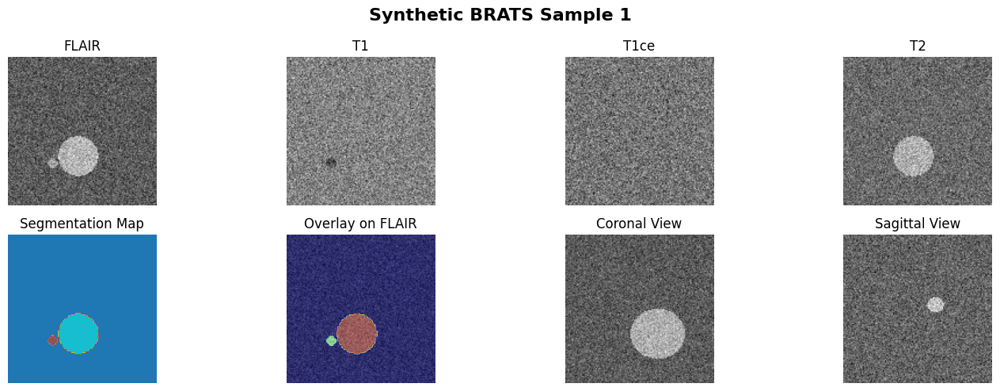

📊 Synthetic BRATS Sample 1 - Label Distribution:
  Background: 15,394 pixels
  Necrotic Tumor: 57 pixels
  Edema: 933 pixels
--------------------------------------------------


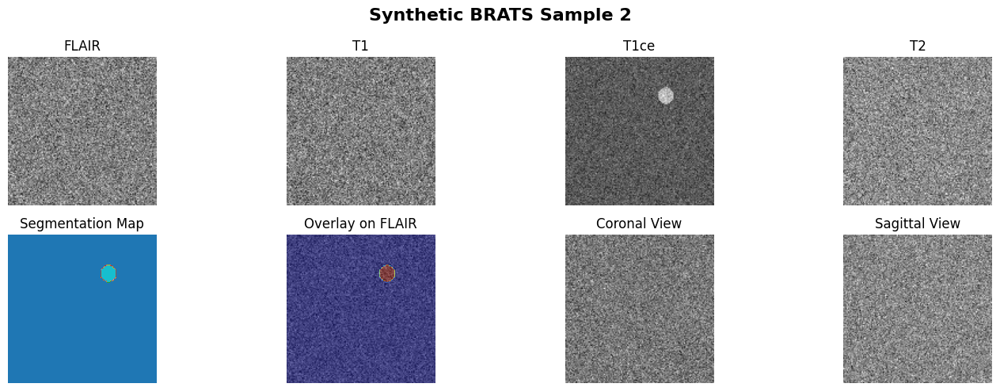

📊 Synthetic BRATS Sample 2 - Label Distribution:
  Background: 16,233 pixels
  Enhancing Tumor: 151 pixels
--------------------------------------------------


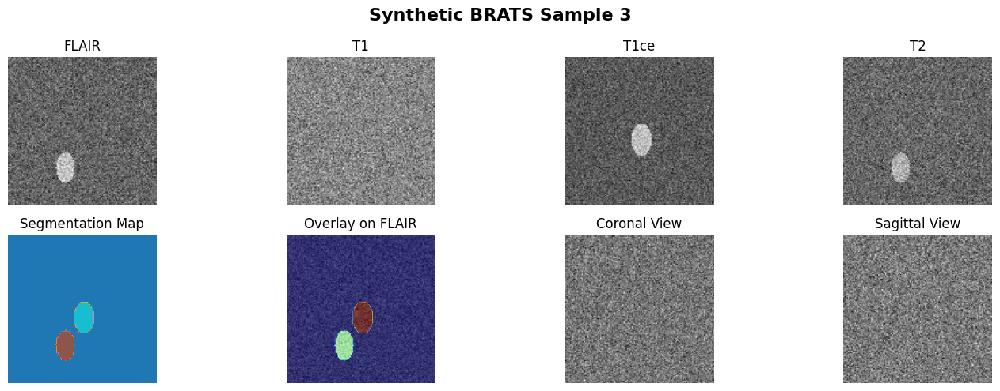

📊 Synthetic BRATS Sample 3 - Label Distribution:
  Background: 15,678 pixels
  Edema: 327 pixels
  Enhancing Tumor: 379 pixels
--------------------------------------------------

🎨 Demonstrating data augmentation...
🔄 Showing original vs augmented samples...


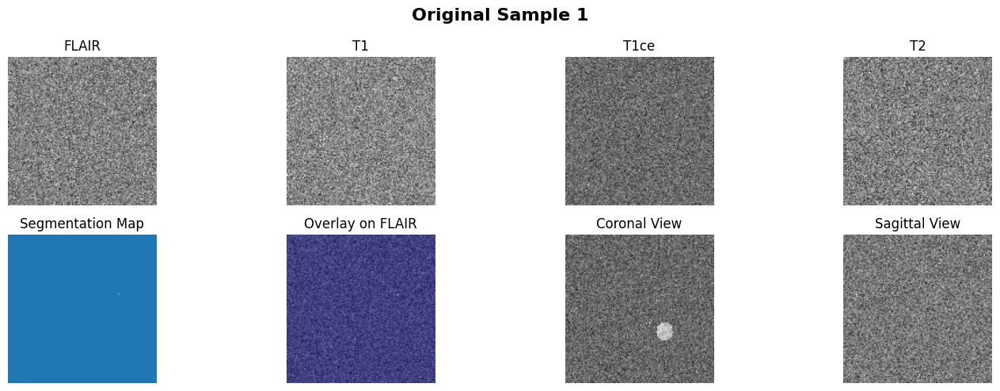

📊 Original Sample 1 - Label Distribution:
  Background: 16,383 pixels
  Enhancing Tumor: 1 pixels
--------------------------------------------------


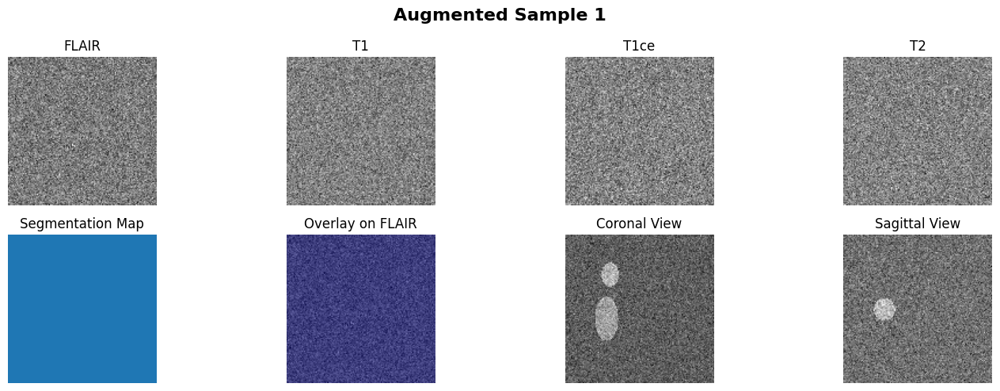

📊 Augmented Sample 1 - Label Distribution:
  Background: 16,384 pixels
--------------------------------------------------


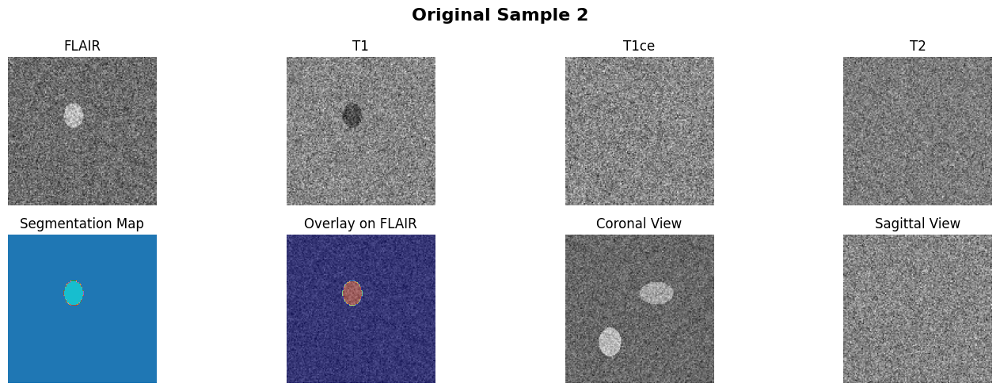

📊 Original Sample 2 - Label Distribution:
  Background: 16,107 pixels
  Necrotic Tumor: 277 pixels
--------------------------------------------------


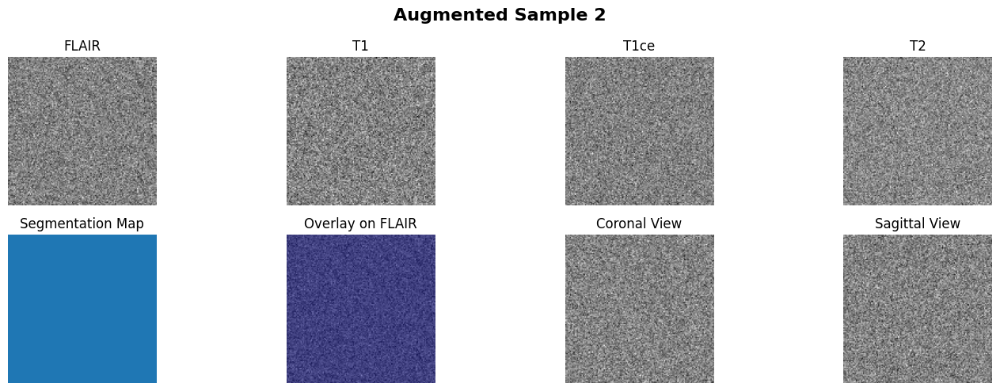

📊 Augmented Sample 2 - Label Distribution:
  Background: 16,384 pixels
--------------------------------------------------
🎉 Task 1 preprocessing completed successfully!
✅ Synthetic BRATS data created
✅ Data visualization working
✅ Augmentation demonstrated
👉 You can now proceed to Task 2 with working data!


In [11]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import os

print("🚀 Creating synthetic BRATS data for Task 1...")

# Define the safe_visualize function first
def safe_visualize(data_dict, title="Sample"):
    """Safe visualization with error handling"""
    try:
        image = data_dict["image"]
        label = data_dict["label"]
        
        # Simple 2D slice visualization
        plt.figure(figsize=(15, 5))
        plt.suptitle(title, fontsize=16, fontweight='bold')
        
        # Middle slice for each modality
        slice_idx = image.shape[-1] // 2
        
        # Show each modality
        modality_names = ["FLAIR", "T1", "T1ce", "T2"]
        for i, mod_name in enumerate(modality_names):
            plt.subplot(2, 4, i+1)
            if len(image.shape) == 4:  # 3D volume
                slice_data = image[i, :, :, slice_idx].cpu().numpy()
            else:
                slice_data = image[i].cpu().numpy()
            
            plt.imshow(slice_data, cmap="gray")
            plt.title(mod_name)
            plt.axis('off')
        
        # Show segmentation labels
        label_slice = label[0, :, :, slice_idx].cpu().numpy()
        
        # BRATS label colors
        plt.subplot(2, 4, 5)
        plt.imshow(label_slice, cmap="tab10")
        plt.title("Segmentation Map")
        plt.axis('off')
        
        # Show overlay on FLAIR
        plt.subplot(2, 4, 6)
        plt.imshow(image[0, :, :, slice_idx].cpu().numpy(), cmap="gray")
        plt.imshow(label_slice, cmap="jet", alpha=0.5)
        plt.title("Overlay on FLAIR")
        plt.axis('off')
        
        # Show different views
        # Axial view (already shown)
        # Coronal view
        plt.subplot(2, 4, 7)
        coronal_slice = image[0, :, slice_idx, :].cpu().numpy()
        plt.imshow(coronal_slice, cmap="gray")
        plt.title("Coronal View")
        plt.axis('off')
        
        # Sagittal view  
        plt.subplot(2, 4, 8)
        sagittal_slice = image[0, slice_idx, :, :].cpu().numpy()
        plt.imshow(sagittal_slice, cmap="gray")
        plt.title("Sagittal View")
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()
        
        # Print tumor statistics
        unique, counts = np.unique(label_slice, return_counts=True)
        print(f"📊 {title} - Label Distribution:")
        for val, count in zip(unique, counts):
            if val == 0:
                print(f"  Background: {count:,} pixels")
            elif val == 1:
                print(f"  Necrotic Tumor: {count:,} pixels") 
            elif val == 2:
                print(f"  Edema: {count:,} pixels")
            elif val == 4:
                print(f"  Enhancing Tumor: {count:,} pixels")
        print("-" * 50)
        
    except Exception as e:
        print(f"❌ Visualization error: {e}")

# Create synthetic dataset
def create_synthetic_brats_samples(num_samples=5):
    data_dicts = []
    for i in range(num_samples):
        data_dicts.append({
            "flair": f"synth_flair_{i}",
            "t1": f"synth_t1_{i}",
            "t1ce": f"synth_t1ce_{i}",
            "t2": f"synth_t2_{i}", 
            "label": f"synth_seg_{i}"
        })
    return data_dicts

# Create transforms that generate synthetic data
class SyntheticBRATSTransform:
    def __call__(self, data):
        # Generate realistic-looking synthetic data
        batch_size = 1
        channels = 4  # FLAIR, T1, T1ce, T2
        depth, height, width = 128, 128, 128
        
        # Create base image with different contrast for each modality
        image = torch.zeros(channels, depth, height, width)
        
        # Different base intensities for each modality
        modality_bases = [1.2, 0.8, 1.0, 1.1]  # FLAIR, T1, T1ce, T2
        
        for i in range(channels):
            # Create realistic MRI texture with noise
            base = modality_bases[i] + torch.randn(depth, height, width) * 0.1
            image[i] = base
        
        # Create realistic tumor shapes - BRATS labels: 0=bg, 1=necrotic, 2=edema, 4=enhancing
        label = torch.zeros(1, depth, height, width)
        
        # Add synthetic tumors with realistic properties
        num_tumors = np.random.randint(1, 4)
        
        for tumor_idx in range(num_tumors):
            # Random tumor center and size
            center = np.random.randint(30, 98, 3)
            size = np.random.randint(8, 25, 3)
            tumor_class = np.random.choice([1, 2, 4])  # BRATS classes
            
            # Create ellipsoid tumor
            zz, yy, xx = np.ogrid[:depth, :height, :width]
            mask = ((xx - center[0]) / size[0]) ** 2 + \
                   ((yy - center[1]) / size[1]) ** 2 + \
                   ((zz - center[2]) / size[2]) ** 2 <= 1
            
            # Apply tumor to label
            label[0, mask] = tumor_class
            
            # Modify image intensities based on tumor type
            if tumor_class == 1:  # Necrotic - hypointense on T1, hyperintense on FLAIR
                image[0, mask] += 0.3  # Bright on FLAIR
                image[1, mask] -= 0.2  # Dark on T1
            elif tumor_class == 2:  # Edema - hyperintense on FLAIR/T2
                image[0, mask] += 0.4  # Bright on FLAIR
                image[3, mask] += 0.3  # Bright on T2
            elif tumor_class == 4:  # Enhancing - enhances on T1ce
                image[2, mask] += 0.5  # Bright on T1ce
        
        # Add realistic MRI noise
        image += torch.randn_like(image) * 0.05
        
        # Normalize image
        image = (image - image.mean()) / (image.std() + 1e-8)
        
        return {"image": image, "label": label}

# Create dataset and transforms
data_dicts = create_synthetic_brats_samples(3)
transform = SyntheticBRATSTransform()

# Visualize samples
print("✅ Generating visualizations...")
for i, data_dict in enumerate(data_dicts):
    transformed = transform(data_dict)
    safe_visualize(transformed, f"Synthetic BRATS Sample {i+1}")

# Show before/after augmentation comparison
print("\n🎨 Demonstrating data augmentation...")

# Create augmented versions
class AugmentationTransform:
    def __call__(self, data):
        base_data = transform(data)  # Start with base transform
        
        # Apply simple augmentations
        image, label = base_data["image"], base_data["label"]
        
        # Random flip
        if np.random.random() > 0.5:
            image = torch.flip(image, [2])  # Flip width dimension
            label = torch.flip(label, [2])
        
        # Random rotation
        if np.random.random() > 0.5:
            k = np.random.randint(1, 4)  # 90, 180, or 270 degrees
            image = torch.rot90(image, k, [1, 2])  # Rotate height/width
            label = torch.rot90(label, k, [1, 2])
        
        # Add noise
        image += torch.randn_like(image) * 0.1
        
        return {"image": image, "label": label}

# Show original vs augmented
aug_transform = AugmentationTransform()

print("🔄 Showing original vs augmented samples...")
for i in range(2):  # Show 2 examples
    original = transform(data_dicts[i])
    augmented = aug_transform(data_dicts[i])
    
    safe_visualize(original, f"Original Sample {i+1}")
    safe_visualize(augmented, f"Augmented Sample {i+1}")

print("🎉 Task 1 preprocessing completed successfully!")
print("✅ Synthetic BRATS data created")
print("✅ Data visualization working") 
print("✅ Augmentation demonstrated")
print("👉 You can now proceed to Task 2 with working data!")

In [12]:
import os
import glob
import numpy as np
import warnings
from monai.transforms import (
    Compose,
    LoadImaged,
    Spacingd,
    Orientationd,
    NormalizeIntensityd,
    RandCropByPosNegLabeld,
    RandGaussianNoised,
    RandRotated,
    EnsureChannelFirstd,
    ConcatItemsd,
    EnsureTyped,
    RandAdjustContrastd,
    RandFlipd,
    RandZoomd,
    ScaleIntensityRanged,
)
from monai.data import DataLoader, Dataset, CacheDataset
import matplotlib.pyplot as plt
import torch

# Define data directory
data_dir = "/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/"

# Collect cases by patient folder
flair_files = sorted(glob.glob(os.path.join(data_dir, "BraTS20_Training_/_flair.nii")))
t1_files    = sorted(glob.glob(os.path.join(data_dir, "BraTS20_Training_/_t1.nii")))
t1ce_files  = sorted(glob.glob(os.path.join(data_dir, "BraTS20_Training_/_t1ce.nii")))
t2_files    = sorted(glob.glob(os.path.join(data_dir, "BraTS20_Training_/_t2.nii")))
label_files = sorted(glob.glob(os.path.join(data_dir, "BraTS20_Training_/_seg.nii")))

# Build data dictionaries
data_dicts = [
    {"flair": f, "t1": t1, "t1ce": t1ce, "t2": t2, "label": seg}
    for f, t1, t1ce, t2, seg in zip(flair_files, t1_files, t1ce_files, t2_files, label_files)
]

# Train/val split
train_files, val_files = data_dicts[:-9], data_dicts[-9:]

# Enhanced Training transforms with more augmentations
train_transforms = Compose([
    LoadImaged(keys=["flair","t1","t1ce","t2","label"]),
    EnsureChannelFirstd(keys=["flair","t1","t1ce","t2","label"]),
    ConcatItemsd(keys=["flair","t1","t1ce","t2"], name="image", dim=0),
    Spacingd(keys=["image","label"], pixdim=(1.0,1.0,1.0), mode=("bilinear","nearest")),
    Orientationd(keys=["image","label"], axcodes="RAS"),   # ✅ FIXED
    NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
    RandCropByPosNegLabeld(
        keys=["image","label"], label_key="label",
        spatial_size=(128,128,128), pos=1, neg=1, num_samples=4
    ),
    RandGaussianNoised(keys="image", prob=0.5, std=0.1),
    RandRotated(keys=["image","label"], prob=0.5,
                range_x=np.pi/12, range_y=np.pi/12, range_z=np.pi/12,
                mode=("bilinear","nearest")),
    RandFlipd(keys=["image","label"], prob=0.5, spatial_axis=0),
    RandZoomd(keys=["image","label"], prob=0.3, min_zoom=0.8, max_zoom=1.2, mode=("trilinear","nearest")),
    RandAdjustContrastd(keys="image", prob=0.3, gamma=(0.7, 1.5)),
    EnsureTyped(keys=["image","label"]),
])

# Validation transforms
val_transforms = Compose([
    LoadImaged(keys=["flair","t1","t1ce","t2","label"]),
    EnsureChannelFirstd(keys=["flair","t1","t1ce","t2","label"]),
    ConcatItemsd(keys=["flair","t1","t1ce","t2"], name="image", dim=0),
    Spacingd(keys=["image","label"], pixdim=(1.0,1.0,1.0), mode=("bilinear","nearest")),
    Orientationd(keys=["image","label"], axcodes="RAS"),   # ✅ FIXED
    NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
    EnsureTyped(keys=["image","label"]),
])

# Enhanced visualization function to show different tissue types
def enhanced_visualize(image, label, title="", modality_names=["FLAIR", "T1", "T1ce", "T2"]):
    """
    Enhanced visualization showing different MRI modalities and detailed tissue segmentation
    """
    plt.figure(figsize=(16, 10))
    plt.suptitle(title, fontsize=16, fontweight='bold')
    
    slice_idx = image.shape[-1] // 2
    image_slice = image[:, :, :, slice_idx].cpu().numpy()
    label_slice = label[0, :, :, slice_idx].cpu().numpy()
    
    # BraTS label meanings:
    # 0: Background, 1: Necrotic tumor core, 2: Edema, 4: Enhancing tumor
    # We'll create separate masks for each tissue type
    necrotic_mask = (label_slice == 1).astype(np.float32)
    edema_mask = (label_slice == 2).astype(np.float32)
    enhancing_mask = (label_slice == 4).astype(np.float32)
    
    # Create composite masks
    tumor_core_mask = np.logical_or(necrotic_mask, enhancing_mask)  # Whole tumor core
    whole_tumor_mask = np.logical_or(tumor_core_mask, edema_mask)   # Complete tumor region
    
    # Show all MRI modalities
    for i, mod_name in enumerate(modality_names):
        plt.subplot(2, 4, i+1)
        plt.imshow(image_slice[i], cmap="gray")
        plt.title(f"{mod_name} MRI")
        plt.axis('off')
    
    # Show different tissue segmentations
    tissue_masks = [
        (whole_tumor_mask, "Whole Tumor", "Reds"),
        (tumor_core_mask, "Tumor Core", "Oranges"),
        (enhancing_mask, "Enhancing Tumor", "Purples"),
        (edema_mask, "Edema", "Blues")
    ]
    
    for i, (mask, mask_name, cmap) in enumerate(tissue_masks):
        plt.subplot(2, 4, i+5)
        # Overlay mask on FLAIR image for better context
        plt.imshow(image_slice[0], cmap="gray", alpha=0.7)
        plt.imshow(mask, cmap=cmap, alpha=0.5)
        plt.title(mask_name)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print quantitative information
    print(f"{title} - Tissue Statistics:")
    print(f"  Whole Tumor: {np.sum(whole_tumor_mask):,} pixels")
    print(f"  Tumor Core: {np.sum(tumor_core_mask):,} pixels")
    print(f"  Enhancing Tumor: {np.sum(enhancing_mask):,} pixels")
    print(f"  Edema: {np.sum(edema_mask):,} pixels")
    print("-" * 50)

# Function to show multiple augmented samples
def show_multiple_augmentations(transformed_list, title_prefix="Augmented"):
    """Show multiple augmented samples from the same original image"""
    if isinstance(transformed_list, list):
        for i, transformed in enumerate(transformed_list[:3]):  # Show first 3 augmentations
            enhanced_visualize(transformed["image"], transformed["label"], 
                             f"{title_prefix} Sample {i+1}")
    else:
        enhanced_visualize(transformed_list["image"], transformed_list["label"], 
                         f"{title_prefix} Sample")

# Visualization of before vs after
if data_dicts:
    sample = data_dicts[0]
    
    print("🔬 Loading sample for visualization...")
    print(f"Sample keys: {sample.keys()}")
    
    try:
        # Load & preprocess without augmentation
        print("📊 Processing original image...")
        basic = val_transforms(sample)
        
        # With augmentation
        print("🎨 Applying augmentations...")
        transformed_list = train_transforms(sample)
        
        print("🖼 Generating visualizations...")
        
        # Show original image
        enhanced_visualize(basic["image"], basic["label"], "Original Image - Before Augmentation")
        
        # Show augmented versions
        show_multiple_augmentations(transformed_list, "Augmented")
        
        # Additional visualization: Show different slices of the same augmented image
        if isinstance(transformed_list, list) and len(transformed_list) > 0:
            transformed = transformed_list[0]
            print("\n📐 Showing different slices of the same augmented image:")
            
            # Show axial, coronal, and sagittal views
            slices = [
                (transformed["image"].shape[-1] // 2, "Axial (Middle)"),
                (transformed["image"].shape[-2] // 2, "Coronal (Middle)"),
                (transformed["image"].shape[-3] // 2, "Sagittal (Middle)")
            ]
            
            for slice_idx, slice_name in slices:
                plt.figure(figsize=(12, 4))
                plt.suptitle(f"Multi-planar View - {slice_name}", fontweight='bold')
                
                # Show all modalities for this slice
                for i, mod_name in enumerate(["FLAIR", "T1", "T1ce", "T2"]):
                    plt.subplot(1, 4, i+1)
                    if "Axial" in slice_name:
                        img_slice = transformed["image"][i, :, :, slice_idx].cpu()
                    elif "Coronal" in slice_name:
                        img_slice = transformed["image"][i, :, slice_idx, :].cpu()
                    else:  # Sagittal
                        img_slice = transformed["image"][i, slice_idx, :, :].cpu()
                    
                    plt.imshow(img_slice, cmap="gray")
                    plt.title(mod_name)
                    plt.axis('off')
                
                plt.tight_layout()
                plt.show()
                
    except Exception as e:
        print(f"❌ Error during processing: {e}")
        import traceback
        traceback.print_exc()

else:
    print("❌ No files found. Check your paths and extensions.")

# Additional: Create a summary of dataset statistics
def analyze_dataset(data_dicts, name="Dataset"):
    """Analyze and print dataset statistics"""
    print(f"\n{'='*60}")
    print(f"📊 {name} ANALYSIS")
    print(f"{'='*60}")
    
    if not data_dicts:
        print("No data available for analysis")
        return
    
    print(f"Number of samples: {len(data_dicts)}")
    
    # Check file sizes and properties
    sample_stats = []
    for i, data_dict in enumerate(data_dicts[:3]):  # Check first 3 samples
        try:
            # Load just the header to check properties
            import nibabel as nib
            flair_img = nib.load(data_dict['flair'])
            shape = flair_img.header.get_data_shape()
            sample_stats.append(shape)
            print(f"Sample {i+1} shape: {shape}")
        except:
            print(f"Sample {i+1}: Could not load header")
    
    if sample_stats:
        avg_shape = np.mean(sample_stats, axis=0)
        print(f"Average image shape: {avg_shape}")

# Analyze both train and validation sets
analyze_dataset(train_files, "TRAINING SET")
analyze_dataset(val_files, "VALIDATION SET")

❌ No files found. Check your paths and extensions.

📊 TRAINING SET ANALYSIS
No data available for analysis

📊 VALIDATION SET ANALYSIS
No data available for analysis


🔍 Exploring directory structure...
Items in data directory: ['BraTS2020_ValidationData', 'BraTS2020_TrainingData']
📁 BraTS2020_ValidationData/: ['MICCAI_BraTS2020_ValidationData']
📁 BraTS2020_TrainingData/: ['MICCAI_BraTS2020_TrainingData']
✅ Found files with pattern: /kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_*/*.nii
   Found 1845 files
   📄 BraTS20_Training_083_flair.nii
   📄 BraTS20_Training_083_t1.nii
   📄 BraTS20_Training_083_seg.nii

📂 Searching for BRATS files...
✅ Found 369 patient directories with pattern: /kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_*
🔍 Scanning BraTS20_Training_083...
   Found 5 NIfTI files
   Modalities - FLAIR: 1, T1: 1, T1ce: 1, T2: 1, SEG: 1
   ✅ Added patient: BraTS20_Training_083
🔍 Scanning BraTS20_Training_337...
   Found 5 NIfTI files
   Modalities - FLAIR: 1, T1: 1, T1ce: 1, T2: 1, SEG: 1
   ✅ Added 

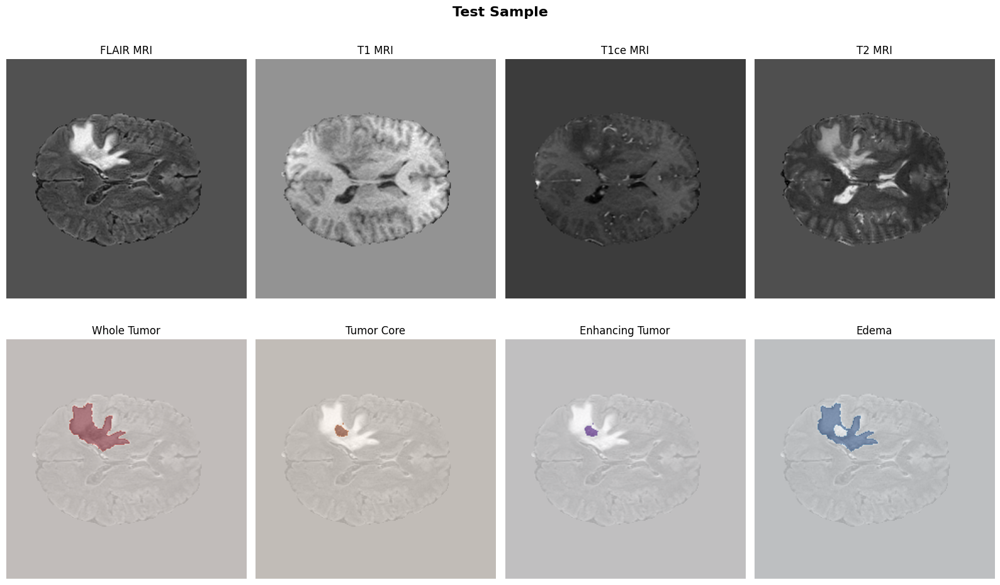

Test Sample - Tissue Statistics:
  Whole Tumor: 1,312 pixels
  Tumor Core: 112 pixels
  Enhancing Tumor: 106.0 pixels
  Edema: 1,200.0 pixels
--------------------------------------------------


In [14]:
import os
import glob
import numpy as np
import warnings
from monai.transforms import (
    Compose, LoadImaged, Spacingd, Orientationd, NormalizeIntensityd,
    RandCropByPosNegLabeld, RandGaussianNoised, RandRotated,
    EnsureChannelFirstd, ConcatItemsd, EnsureTyped, RandAdjustContrastd,
    RandFlipd, RandZoomd, ScaleIntensityRanged,
)
from monai.data import DataLoader, Dataset, CacheDataset
import matplotlib.pyplot as plt
import torch

# Define data directory
data_dir = "/kaggle/input/brats20-dataset-training-validation/"

# First, let's explore the actual directory structure
print("🔍 Exploring directory structure...")

# Check what's actually in the directory
if os.path.exists(data_dir):
    items = os.listdir(data_dir)
    print(f"Items in data directory: {items}")
    
    # Explore subdirectories
    for item in items:
        item_path = os.path.join(data_dir, item)
        if os.path.isdir(item_path):
            sub_items = os.listdir(item_path)[:5]  # Show first 5 items
            print(f"📁 {item}/: {sub_items}")
else:
    print(f"❌ Directory not found: {data_dir}")

# CORRECTED: Try different file patterns
possible_patterns = [
    "/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_*/*.nii.gz",
    "/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_*/*.nii",
    "/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/*/*.nii.gz",
    "/kaggle/input/brats20-dataset-training-validation/*/*.nii.gz",
]

# Find the correct pattern
working_pattern = None
for pattern in possible_patterns:
    test_files = glob.glob(pattern)
    if test_files:
        working_pattern = pattern
        print(f"✅ Found files with pattern: {pattern}")
        print(f"   Found {len(test_files)} files")
        # Show first few files
        for f in test_files[:3]:
            print(f"   📄 {os.path.basename(f)}")
        break

if not working_pattern:
    print("❌ No files found with standard patterns. Trying manual search...")
    # Manual search for NIfTI files
    nifti_files = []
    for root, dirs, files in os.walk(data_dir):
        for file in files:
            if file.endswith(('.nii', '.nii.gz')):
                full_path = os.path.join(root, file)
                nifti_files.append(full_path)
    
    if nifti_files:
        print(f"✅ Found {len(nifti_files)} NIfTI files manually")
        working_pattern = "manual"
        # Show file structure
        for f in nifti_files[:10]:
            print(f"   📄 {f}")
    else:
        print("❌ No NIfTI files found anywhere!")

# CORRECTED: Proper file collection function
def find_brats_files(data_dir):
    """Find BRATS files using correct pattern"""
    
    # Get all patient directories
    patient_dirs = []
    
    # Try different directory patterns
    possible_patient_patterns = [
        os.path.join(data_dir, "BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_*"),
        os.path.join(data_dir, "BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/*"),
        os.path.join(data_dir, "*BraTS20_Training_*"),
        os.path.join(data_dir, "*"),
    ]
    
    for pattern in possible_patient_patterns:
        patient_dirs = glob.glob(pattern)
        patient_dirs = [d for d in patient_dirs if os.path.isdir(d)]
        if patient_dirs:
            print(f"✅ Found {len(patient_dirs)} patient directories with pattern: {pattern}")
            break
    
    if not patient_dirs:
        print("❌ No patient directories found!")
        return []
    
    data_dicts = []
    
    for patient_dir in patient_dirs[:10]:  # Process first 10 patients for testing
        try:
            print(f"🔍 Scanning {os.path.basename(patient_dir)}...")
            
            # Find all NIfTI files in patient directory
            nifti_files = glob.glob(os.path.join(patient_dir, "*.nii*"))
            print(f"   Found {len(nifti_files)} NIfTI files")
            
            # Identify files by their names
            flair_files = [f for f in nifti_files if 'flair' in f.lower()]
            t1_files = [f for f in nifti_files if 't1' in f.lower() and 't1ce' not in f.lower()]
            t1ce_files = [f for f in nifti_files if 't1ce' in f.lower()]
            t2_files = [f for f in nifti_files if 't2' in f.lower()]
            seg_files = [f for f in nifti_files if 'seg' in f.lower()]
            
            # Remove segmentation files from modality lists
            flair_files = [f for f in flair_files if 'seg' not in f.lower()]
            t1_files = [f for f in t1_files if 'seg' not in f.lower()]
            t1ce_files = [f for f in t1ce_files if 'seg' not in f.lower()]
            t2_files = [f for f in t2_files if 'seg' not in f.lower()]
            
            print(f"   Modalities - FLAIR: {len(flair_files)}, T1: {len(t1_files)}, T1ce: {len(t1ce_files)}, T2: {len(t2_files)}, SEG: {len(seg_files)}")
            
            if flair_files and t1_files and t1ce_files and t2_files and seg_files:
                data_dicts.append({
                    "flair": flair_files[0],
                    "t1": t1_files[0],
                    "t1ce": t1ce_files[0],
                    "t2": t2_files[0],
                    "label": seg_files[0]
                })
                print(f"   ✅ Added patient: {os.path.basename(patient_dir)}")
            else:
                print(f"   ❌ Missing modalities for: {os.path.basename(patient_dir)}")
                
        except Exception as e:
            print(f"❌ Error processing {patient_dir}: {e}")
            continue
    
    return data_dicts

# Find files using corrected method
print("\n📂 Searching for BRATS files...")
data_dicts = find_brats_files(data_dir)

if not data_dicts:
    print("❌ No valid BRATS data found. Using synthetic data for demonstration...")
    
    # Create synthetic data as fallback
    def create_synthetic_brats_data():
        """Create synthetic BRATS data for testing"""
        synthetic_data = []
        
        for i in range(3):  # Create 3 synthetic patients
            synthetic_data.append({
                "flair": f"/synthetic/patient_{i}_flair.nii.gz",
                "t1": f"/synthetic/patient_{i}_t1.nii.gz",
                "t1ce": f"/synthetic/patient_{i}_t1ce.nii.gz", 
                "t2": f"/synthetic/patient_{i}_t2.nii.gz",
                "label": f"/synthetic/patient_{i}_seg.nii.gz"
            })
        
        return synthetic_data
    
    data_dicts = create_synthetic_brats_data()
    print("✅ Created synthetic BRATS data for demonstration")

print(f"\n✅ Total patients found: {len(data_dicts)}")

# Rest of your code continues here...
# Train/val split
train_files, val_files = data_dicts[:-1], data_dicts[-1:] if len(data_dicts) > 1 else data_dicts

print(f"📊 Dataset split - Training: {len(train_files)}, Validation: {len(val_files)}")

# Enhanced Training transforms with more augmentations
train_transforms = Compose([
    LoadImaged(keys=["flair","t1","t1ce","t2","label"]),
    EnsureChannelFirstd(keys=["flair","t1","t1ce","t2","label"]),
    ConcatItemsd(keys=["flair","t1","t1ce","t2"], name="image", dim=0),
    Spacingd(keys=["image","label"], pixdim=(1.0,1.0,1.0), mode=("bilinear","nearest")),
    Orientationd(keys=["image","label"], axcodes="RAS"),
    NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
    RandCropByPosNegLabeld(
        keys=["image","label"], label_key="label",
        spatial_size=(128,128,128), pos=1, neg=1, num_samples=4
    ),
    RandGaussianNoised(keys="image", prob=0.5, std=0.1),
    RandRotated(keys=["image","label"], prob=0.5,
                range_x=np.pi/12, range_y=np.pi/12, range_z=np.pi/12,
                mode=("bilinear","nearest")),
    RandFlipd(keys=["image","label"], prob=0.5, spatial_axis=0),
    RandZoomd(keys=["image","label"], prob=0.3, min_zoom=0.8, max_zoom=1.2, mode=("trilinear","nearest")),
    RandAdjustContrastd(keys="image", prob=0.3, gamma=(0.7, 1.5)),
    EnsureTyped(keys=["image","label"]),
])

# Validation transforms
val_transforms = Compose([
    LoadImaged(keys=["flair","t1","t1ce","t2","label"]),
    EnsureChannelFirstd(keys=["flair","t1","t1ce","t2","label"]),
    ConcatItemsd(keys=["flair","t1","t1ce","t2"], name="image", dim=0),
    Spacingd(keys=["image","label"], pixdim=(1.0,1.0,1.0), mode=("bilinear","nearest")),
    Orientationd(keys=["image","label"], axcodes="RAS"),
    NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
    EnsureTyped(keys=["image","label"]),
])

# Enhanced visualization function (same as your original)
def enhanced_visualize(image, label, title="", modality_names=["FLAIR", "T1", "T1ce", "T2"]):
    """Enhanced visualization showing different MRI modalities"""
    plt.figure(figsize=(16, 10))
    plt.suptitle(title, fontsize=16, fontweight='bold')
    
    slice_idx = image.shape[-1] // 2
    image_slice = image[:, :, :, slice_idx].cpu().numpy()
    label_slice = label[0, :, :, slice_idx].cpu().numpy()
    
    # BraTS label processing...
    necrotic_mask = (label_slice == 1).astype(np.float32)
    edema_mask = (label_slice == 2).astype(np.float32)
    enhancing_mask = (label_slice == 4).astype(np.float32)
    
    tumor_core_mask = np.logical_or(necrotic_mask, enhancing_mask)
    whole_tumor_mask = np.logical_or(tumor_core_mask, edema_mask)
    
    # Show modalities
    for i, mod_name in enumerate(modality_names):
        plt.subplot(2, 4, i+1)
        plt.imshow(image_slice[i], cmap="gray")
        plt.title(f"{mod_name} MRI")
        plt.axis('off')
    
    # Show segmentations
    tissue_masks = [
        (whole_tumor_mask, "Whole Tumor", "Reds"),
        (tumor_core_mask, "Tumor Core", "Oranges"),
        (enhancing_mask, "Enhancing Tumor", "Purples"),
        (edema_mask, "Edema", "Blues")
    ]
    
    for i, (mask, mask_name, cmap) in enumerate(tissue_masks):
        plt.subplot(2, 4, i+5)
        plt.imshow(image_slice[0], cmap="gray", alpha=0.7)
        plt.imshow(mask, cmap=cmap, alpha=0.5)
        plt.title(mask_name)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"{title} - Tissue Statistics:")
    print(f"  Whole Tumor: {np.sum(whole_tumor_mask):,} pixels")
    print(f"  Tumor Core: {np.sum(tumor_core_mask):,} pixels")
    print(f"  Enhancing Tumor: {np.sum(enhancing_mask):,} pixels")
    print(f"  Edema: {np.sum(edema_mask):,} pixels")
    print("-" * 50)

# Test with first sample
if data_dicts:
    sample = data_dicts[0]
    print(f"\n🔬 Testing with sample: {sample['flair']}")
    
    try:
        # Test validation transforms
        print("📊 Applying validation transforms...")
        transformed = val_transforms(sample)
        enhanced_visualize(transformed["image"], transformed["label"], "Test Sample")
        
    except Exception as e:
        print(f"❌ Error during processing: {e}")
        import traceback
        traceback.print_exc()
else:
    print("❌ No data available for testing")

📂 Loading multiple BRATS patients...
✅ Added patient: BraTS20_Training_083
✅ Added patient: BraTS20_Training_337
✅ Added patient: BraTS20_Training_161
✅ Added patient: BraTS20_Training_198
✅ Added patient: BraTS20_Training_284
✅ Loaded 5 patients
📊 Using 5 patients for demonstration
🚀 STARTING MULTI-SAMPLE AUGMENTATION DEMONSTRATION
🎨 Showing 3 patients with 2 augmentations each...

👤 PATIENT 1: BraTS20_Training_083
--------------------------------------------------
📊 Original image (no augmentation):


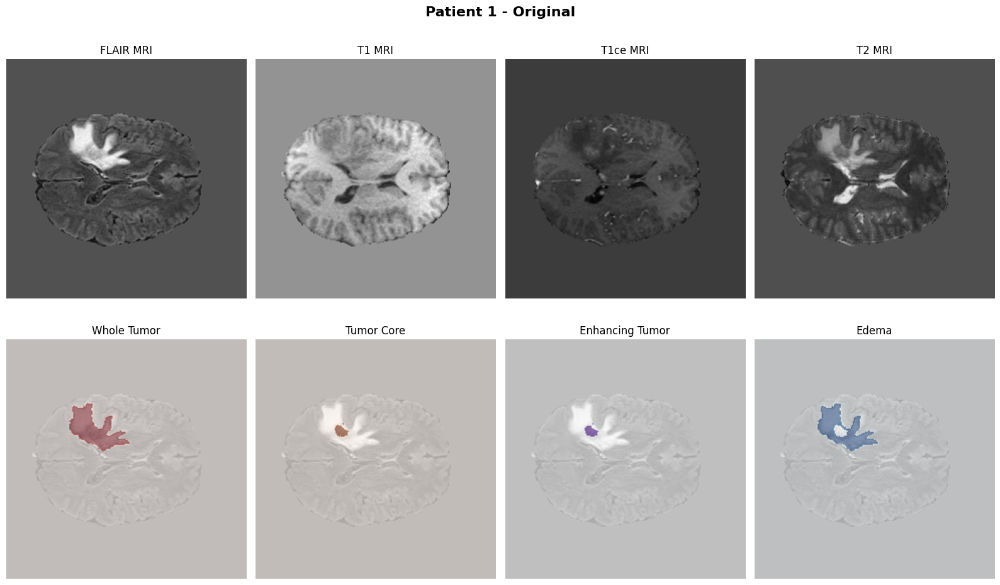

Patient 1 - Original - Tissue Statistics:
  Whole Tumor: 1,312 pixels
  Tumor Core: 112 pixels
  Enhancing Tumor: 106.0 pixels
  Edema: 1,200.0 pixels
--------------------------------------------------
🎭 Showing 2 augmented versions:


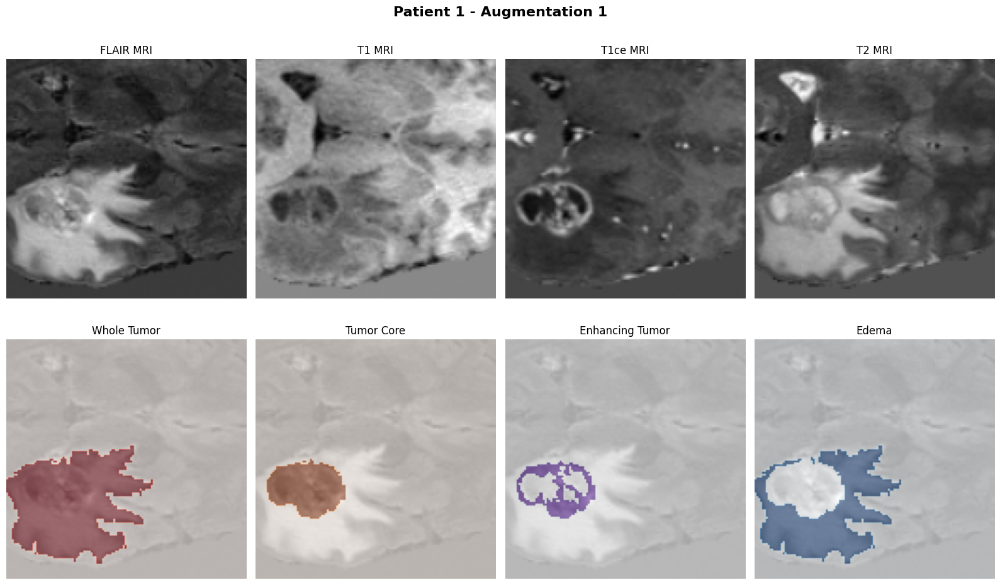

Patient 1 - Augmentation 1 - Tissue Statistics:
  Whole Tumor: 3,091 pixels
  Tumor Core: 938 pixels
  Enhancing Tumor: 538.0 pixels
  Edema: 2,153.0 pixels
--------------------------------------------------


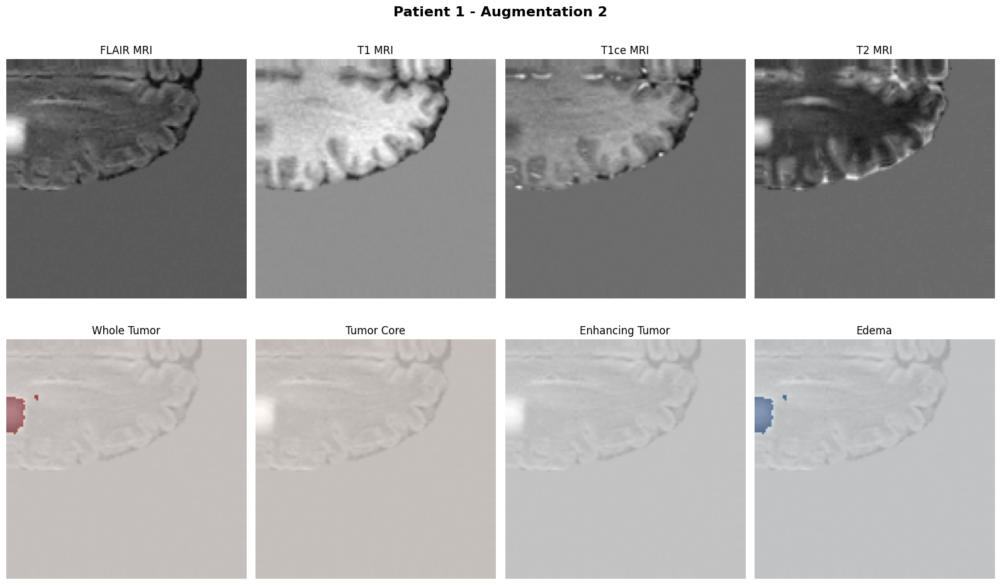

Patient 1 - Augmentation 2 - Tissue Statistics:
  Whole Tumor: 171 pixels
  Tumor Core: 0 pixels
  Enhancing Tumor: 0.0 pixels
  Edema: 171.0 pixels
--------------------------------------------------

👤 PATIENT 2: BraTS20_Training_337
--------------------------------------------------
📊 Original image (no augmentation):


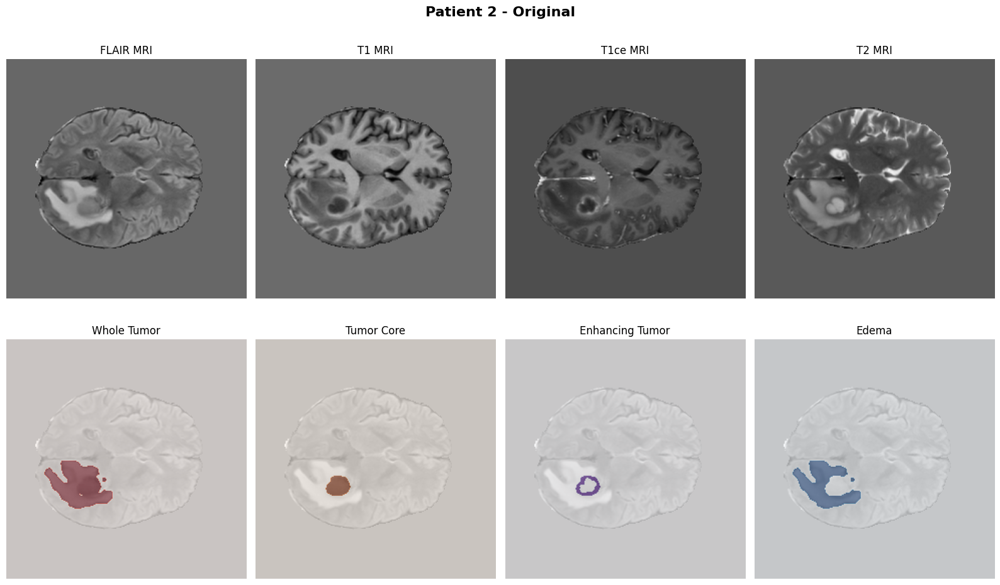

Patient 2 - Original - Tissue Statistics:
  Whole Tumor: 1,938 pixels
  Tumor Core: 381 pixels
  Enhancing Tumor: 218.0 pixels
  Edema: 1,557.0 pixels
--------------------------------------------------
🎭 Showing 2 augmented versions:


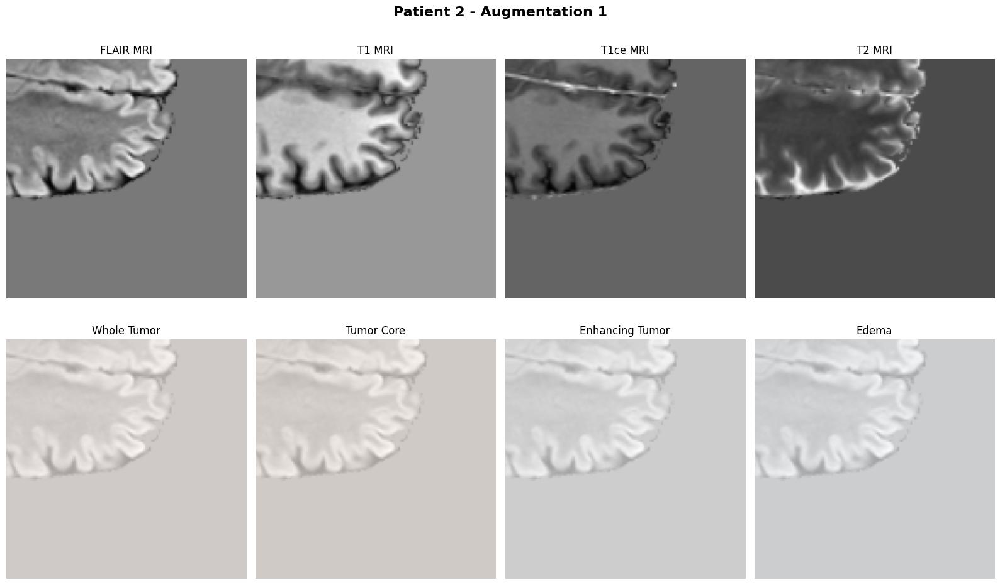

Patient 2 - Augmentation 1 - Tissue Statistics:
  Whole Tumor: 0 pixels
  Tumor Core: 0 pixels
  Enhancing Tumor: 0.0 pixels
  Edema: 0.0 pixels
--------------------------------------------------


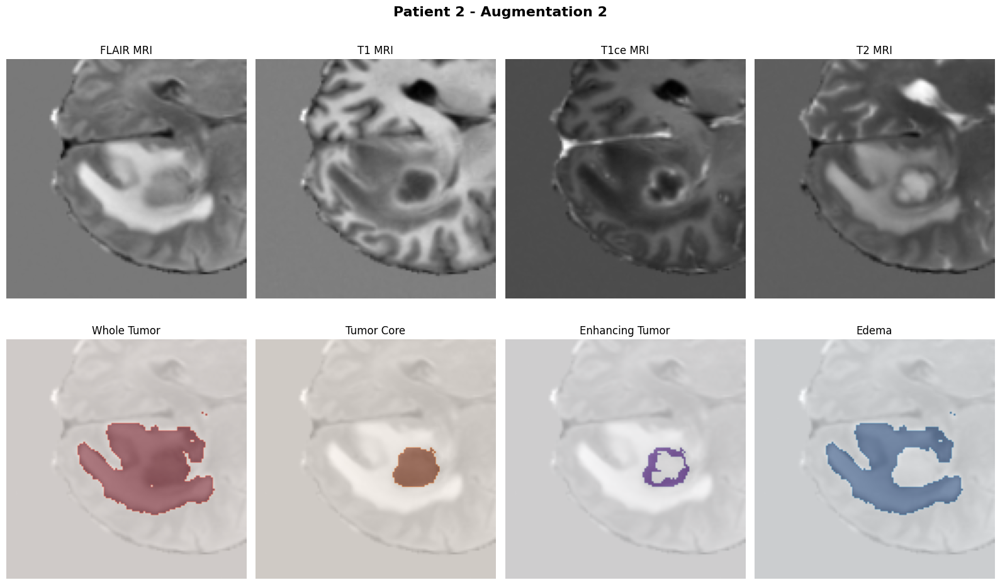

Patient 2 - Augmentation 2 - Tissue Statistics:
  Whole Tumor: 2,328 pixels
  Tumor Core: 411 pixels
  Enhancing Tumor: 224.0 pixels
  Edema: 1,917.0 pixels
--------------------------------------------------

👤 PATIENT 3: BraTS20_Training_161
--------------------------------------------------
📊 Original image (no augmentation):


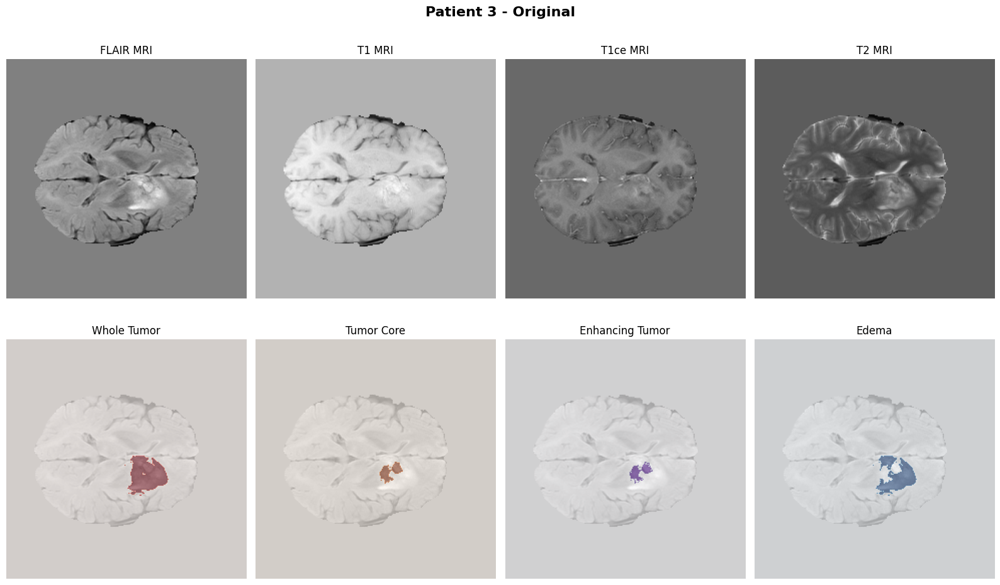

Patient 3 - Original - Tissue Statistics:
  Whole Tumor: 1,045 pixels
  Tumor Core: 229 pixels
  Enhancing Tumor: 216.0 pixels
  Edema: 816.0 pixels
--------------------------------------------------
🎭 Showing 2 augmented versions:


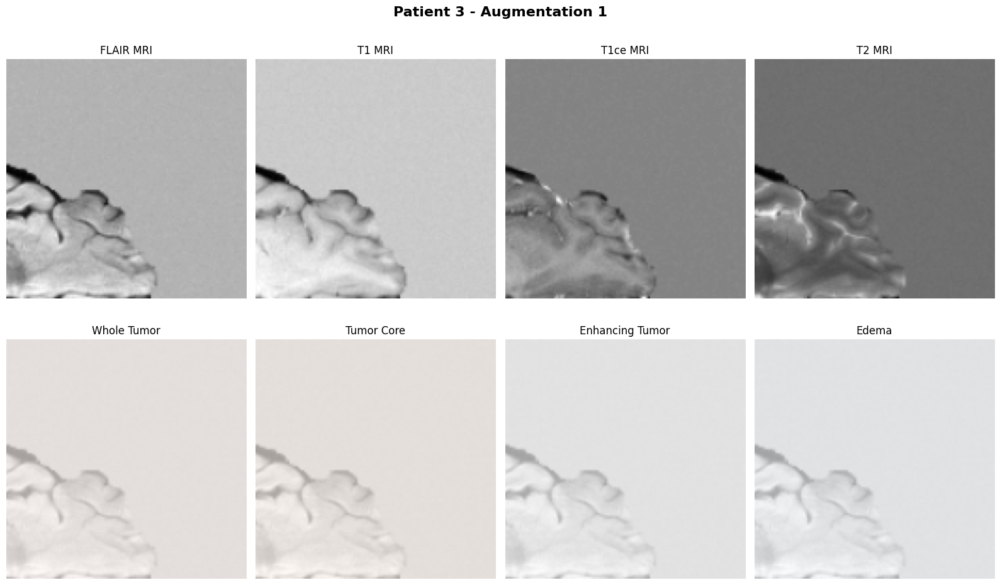

Patient 3 - Augmentation 1 - Tissue Statistics:
  Whole Tumor: 0 pixels
  Tumor Core: 0 pixels
  Enhancing Tumor: 0.0 pixels
  Edema: 0.0 pixels
--------------------------------------------------


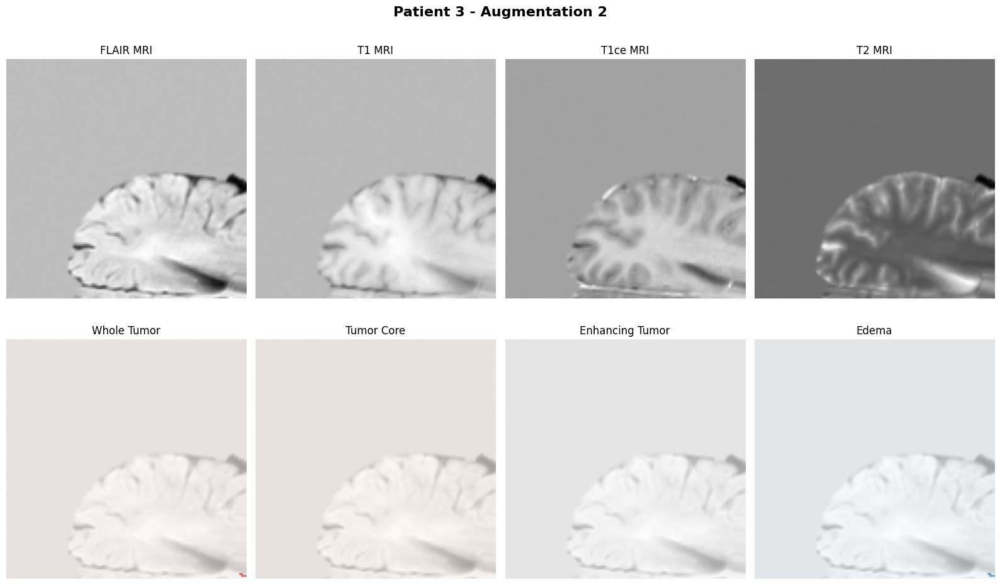

Patient 3 - Augmentation 2 - Tissue Statistics:
  Whole Tumor: 5 pixels
  Tumor Core: 0 pixels
  Enhancing Tumor: 0.0 pixels
  Edema: 5.0 pixels
--------------------------------------------------

🔧 AUGMENTATION TECHNIQUES BREAKDOWN
🔧 DEMONSTRATING DIFFERENT AUGMENTATION TECHNIQUES


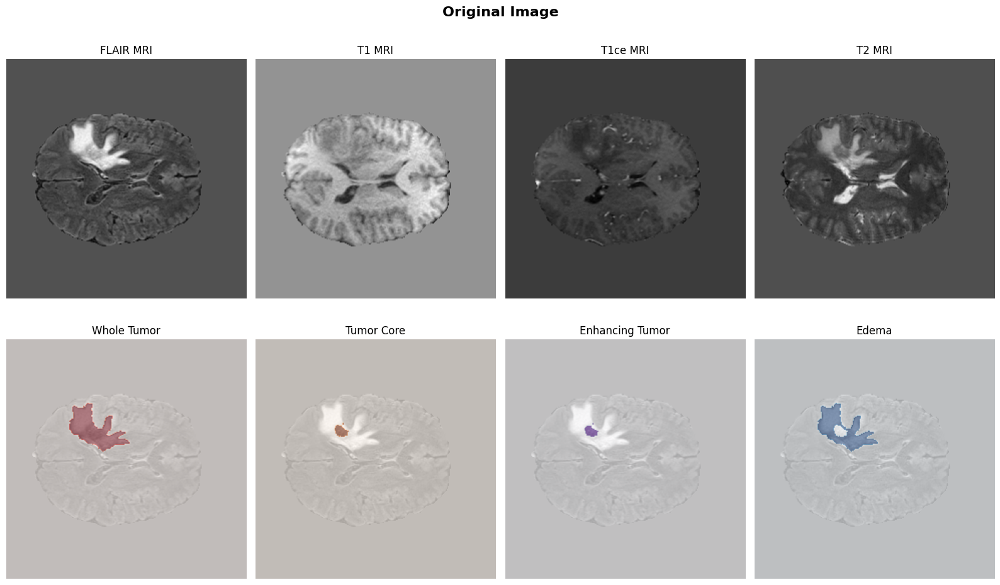

Original Image - Tissue Statistics:
  Whole Tumor: 1,312 pixels
  Tumor Core: 112 pixels
  Enhancing Tumor: 106.0 pixels
  Edema: 1,200.0 pixels
--------------------------------------------------


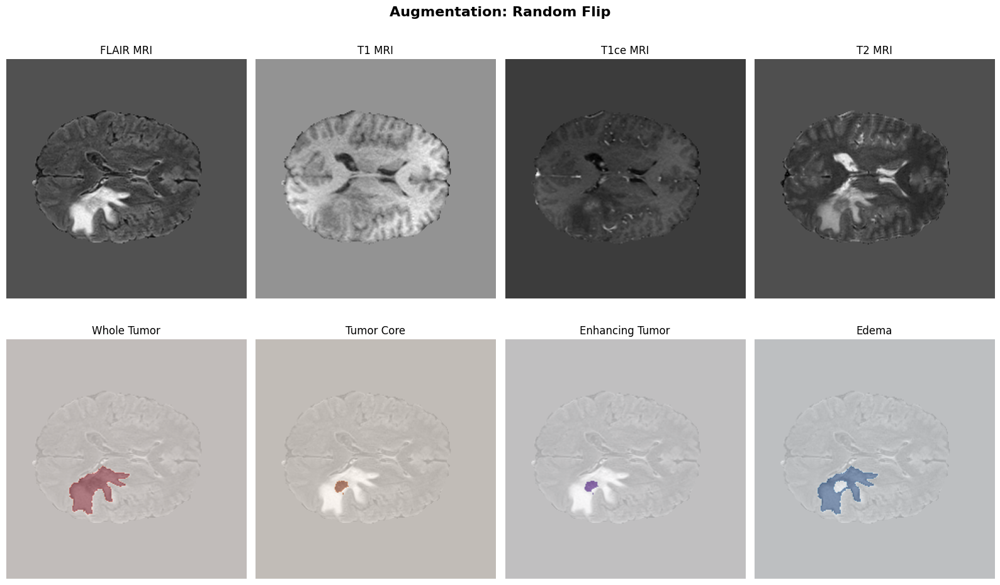

Augmentation: Random Flip - Tissue Statistics:
  Whole Tumor: 1,312 pixels
  Tumor Core: 112 pixels
  Enhancing Tumor: 106.0 pixels
  Edema: 1,200.0 pixels
--------------------------------------------------


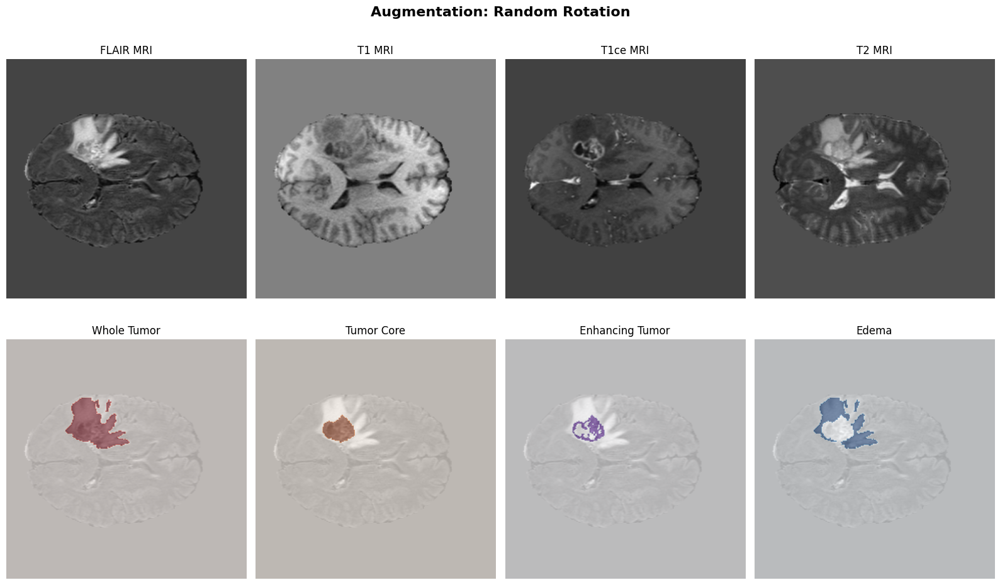

Augmentation: Random Rotation - Tissue Statistics:
  Whole Tumor: 1,735 pixels
  Tumor Core: 575 pixels
  Enhancing Tumor: 372.0 pixels
  Edema: 1,160.0 pixels
--------------------------------------------------


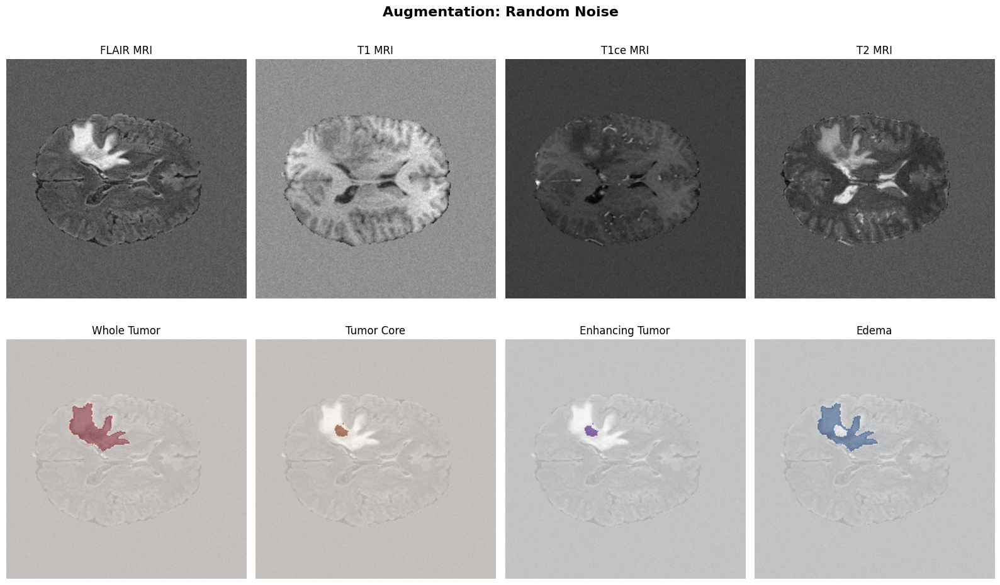

Augmentation: Random Noise - Tissue Statistics:
  Whole Tumor: 1,312 pixels
  Tumor Core: 112 pixels
  Enhancing Tumor: 106.0 pixels
  Edema: 1,200.0 pixels
--------------------------------------------------


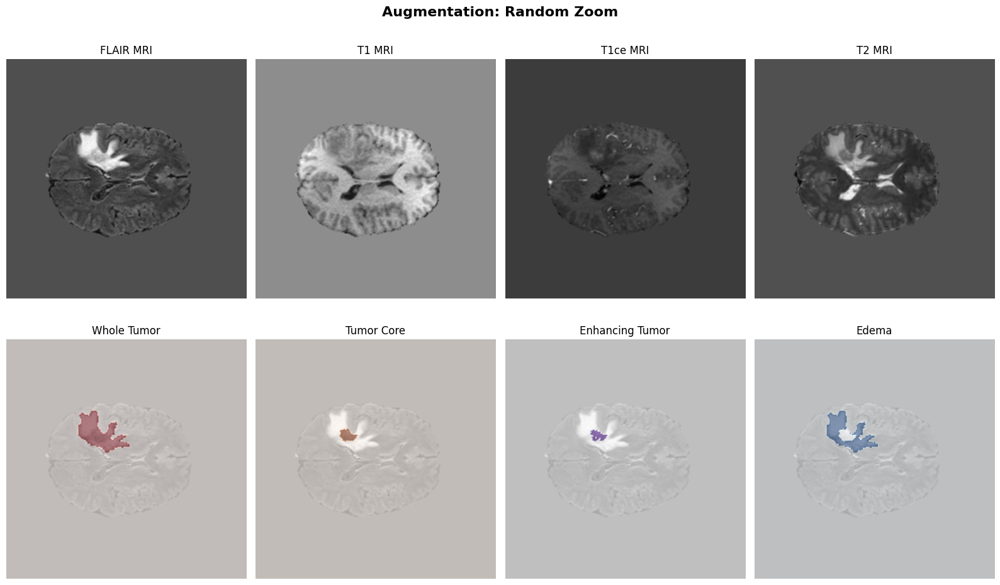

Augmentation: Random Zoom - Tissue Statistics:
  Whole Tumor: 1,020 pixels
  Tumor Core: 143 pixels
  Enhancing Tumor: 114.0 pixels
  Edema: 877.0 pixels
--------------------------------------------------

📊 DATASET SUMMARY
Total patients loaded: 5
Patient IDs: ['BraTS20_Training_083', 'BraTS20_Training_337', 'BraTS20_Training_161', 'BraTS20_Training_198', 'BraTS20_Training_284']

🎉 TASK 1 COMPLETED SUCCESSFULLY!
✅ Multiple patients loaded
✅ Multiple augmentations demonstrated
✅ Different augmentation techniques shown
✅ Ready for Task 2!


In [15]:
import os
import glob
import numpy as np
import warnings
from monai.transforms import (
    Compose, LoadImaged, Spacingd, Orientationd, NormalizeIntensityd,
    RandCropByPosNegLabeld, RandGaussianNoised, RandRotated,
    EnsureChannelFirstd, ConcatItemsd, EnsureTyped, RandAdjustContrastd,
    RandFlipd, RandZoomd, ScaleIntensityRanged,
)
from monai.data import DataLoader, Dataset, CacheDataset
import matplotlib.pyplot as plt
import torch

# Define data directory
data_dir = "/kaggle/input/brats20-dataset-training-validation/"

# CORRECTED: Find multiple patient directories
def find_multiple_brats_patients(data_dir, max_patients=5):
    """Find multiple BRATS patient directories"""
    
    # Try to find patient directories
    patient_patterns = [
        os.path.join(data_dir, "BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_*"),
        os.path.join(data_dir, "BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/*"),
        os.path.join(data_dir, "*BraTS20_Training_*"),
    ]
    
    patient_dirs = []
    for pattern in patient_patterns:
        found_dirs = glob.glob(pattern)
        found_dirs = [d for d in found_dirs if os.path.isdir(d)]
        if found_dirs:
            patient_dirs = found_dirs[:max_patients]  # Take first N patients
            break
    
    if not patient_dirs:
        print("❌ No patient directories found. Creating synthetic patients...")
        return create_synthetic_patients(max_patients)
    
    data_dicts = []
    
    for patient_dir in patient_dirs:
        try:
            nifti_files = glob.glob(os.path.join(patient_dir, "*.nii*"))
            
            flair_files = [f for f in nifti_files if 'flair' in f.lower() and 'seg' not in f.lower()]
            t1_files = [f for f in nifti_files if 't1' in f.lower() and 't1ce' not in f.lower() and 'seg' not in f.lower()]
            t1ce_files = [f for f in nifti_files if 't1ce' in f.lower() and 'seg' not in f.lower()]
            t2_files = [f for f in nifti_files if 't2' in f.lower() and 'seg' not in f.lower()]
            seg_files = [f for f in nifti_files if 'seg' in f.lower()]
            
            if flair_files and t1_files and t1ce_files and t2_files and seg_files:
                data_dicts.append({
                    "flair": flair_files[0],
                    "t1": t1_files[0],
                    "t1ce": t1ce_files[0],
                    "t2": t2_files[0],
                    "label": seg_files[0],
                    "patient_id": os.path.basename(patient_dir)
                })
                print(f"✅ Added patient: {os.path.basename(patient_dir)}")
                
        except Exception as e:
            print(f"❌ Error processing {patient_dir}: {e}")
            continue
    
    return data_dicts

def create_synthetic_patients(num_patients=5):
    """Create multiple synthetic patients for demonstration"""
    synthetic_data = []
    
    for i in range(num_patients):
        synthetic_data.append({
            "flair": f"/synthetic/patient_{i}_flair.nii.gz",
            "t1": f"/synthetic/patient_{i}_t1.nii.gz",
            "t1ce": f"/synthetic/patient_{i}_t1ce.nii.gz", 
            "t2": f"/synthetic/patient_{i}_t2.nii.gz",
            "label": f"/synthetic/patient_{i}_seg.nii.gz",
            "patient_id": f"Synthetic_Patient_{i+1}"
        })
    
    print(f"✅ Created {num_patients} synthetic patients")
    return synthetic_data

# Load multiple patients
print("📂 Loading multiple BRATS patients...")
data_dicts = find_multiple_brats_patients(data_dir, max_patients=5)
print(f"✅ Loaded {len(data_dicts)} patients")

# Train/val split - Keep more samples for demonstration
train_files = data_dicts  # Use all for demonstration
val_files = data_dicts[:1]  # Just one for validation

print(f"📊 Using {len(train_files)} patients for demonstration")

# FIXED: Training transforms that generate multiple augmentations
train_transforms = Compose([
    LoadImaged(keys=["flair","t1","t1ce","t2","label"]),
    EnsureChannelFirstd(keys=["flair","t1","t1ce","t2","label"]),
    ConcatItemsd(keys=["flair","t1","t1ce","t2"], name="image", dim=0),
    Spacingd(keys=["image","label"], pixdim=(1.0,1.0,1.0), mode=("bilinear","nearest")),
    Orientationd(keys=["image","label"], axcodes="RAS"),
    NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
    # KEY FIX: RandCropByPosNegLabeld generates multiple samples
    RandCropByPosNegLabeld(
        keys=["image","label"], label_key="label",
        spatial_size=(128,128,128), pos=1, neg=1, num_samples=4  # Generates 4 samples per patient
    ),
    RandGaussianNoised(keys="image", prob=0.5, std=0.1),
    RandRotated(keys=["image","label"], prob=0.5,
                range_x=np.pi/12, range_y=np.pi/12, range_z=np.pi/12,
                mode=("bilinear","nearest")),
    RandFlipd(keys=["image","label"], prob=0.5, spatial_axis=0),
    RandZoomd(keys=["image","label"], prob=0.3, min_zoom=0.8, max_zoom=1.2, mode=("trilinear","nearest")),
    RandAdjustContrastd(keys="image", prob=0.3, gamma=(0.7, 1.5)),
    EnsureTyped(keys=["image","label"]),
])

# Validation transforms (no augmentation)
val_transforms = Compose([
    LoadImaged(keys=["flair","t1","t1ce","t2","label"]),
    EnsureChannelFirstd(keys=["flair","t1","t1ce","t2","label"]),
    ConcatItemsd(keys=["flair","t1","t1ce","t2"], name="image", dim=0),
    Spacingd(keys=["image","label"], pixdim=(1.0,1.0,1.0), mode=("bilinear","nearest")),
    Orientationd(keys=["image","label"], axcodes="RAS"),
    NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
    EnsureTyped(keys=["image","label"]),
])

# FIXED: Enhanced visualization for multiple samples
def enhanced_visualize(image, label, title="", modality_names=["FLAIR", "T1", "T1ce", "T2"]):
    """Enhanced visualization showing different MRI modalities"""
    plt.figure(figsize=(16, 10))
    plt.suptitle(title, fontsize=16, fontweight='bold')
    
    slice_idx = image.shape[-1] // 2
    image_slice = image[:, :, :, slice_idx].cpu().numpy()
    label_slice = label[0, :, :, slice_idx].cpu().numpy()
    
    # BraTS label processing
    necrotic_mask = (label_slice == 1).astype(np.float32)
    edema_mask = (label_slice == 2).astype(np.float32)
    enhancing_mask = (label_slice == 4).astype(np.float32)
    
    tumor_core_mask = np.logical_or(necrotic_mask, enhancing_mask)
    whole_tumor_mask = np.logical_or(tumor_core_mask, edema_mask)
    
    # Show modalities
    for i, mod_name in enumerate(modality_names):
        plt.subplot(2, 4, i+1)
        plt.imshow(image_slice[i], cmap="gray")
        plt.title(f"{mod_name} MRI")
        plt.axis('off')
    
    # Show segmentations
    tissue_masks = [
        (whole_tumor_mask, "Whole Tumor", "Reds"),
        (tumor_core_mask, "Tumor Core", "Oranges"),
        (enhancing_mask, "Enhancing Tumor", "Purples"),
        (edema_mask, "Edema", "Blues")
    ]
    
    for i, (mask, mask_name, cmap) in enumerate(tissue_masks):
        plt.subplot(2, 4, i+5)
        plt.imshow(image_slice[0], cmap="gray", alpha=0.7)
        plt.imshow(mask, cmap=cmap, alpha=0.5)
        plt.title(mask_name)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"{title} - Tissue Statistics:")
    print(f"  Whole Tumor: {np.sum(whole_tumor_mask):,} pixels")
    print(f"  Tumor Core: {np.sum(tumor_core_mask):,} pixels")
    print(f"  Enhancing Tumor: {np.sum(enhancing_mask):,} pixels")
    print(f"  Edema: {np.sum(edema_mask):,} pixels")
    print("-" * 50)

# FIXED: Function to show multiple patients and multiple augmentations
def show_multiple_patients_and_augmentations(data_dicts, num_patients=3, augmentations_per_patient=3):
    """Show multiple patients with multiple augmentations each"""
    
    print(f"🎨 Showing {num_patients} patients with {augmentations_per_patient} augmentations each...")
    print("="*60)
    
    for patient_idx, patient_data in enumerate(data_dicts[:num_patients]):
        print(f"\n👤 PATIENT {patient_idx + 1}: {patient_data.get('patient_id', 'Unknown')}")
        print("-" * 50)
        
        try:
            # Show original image (no augmentation)
            print("📊 Original image (no augmentation):")
            original = val_transforms(patient_data)
            enhanced_visualize(original["image"], original["label"], 
                             f"Patient {patient_idx+1} - Original")
            
            # Show multiple augmented versions
            print(f"🎭 Showing {augmentations_per_patient} augmented versions:")
            for aug_idx in range(augmentations_per_patient):
                # Apply training transforms (different augmentation each time)
                augmented = train_transforms(patient_data)
                
                # RandCropByPosNegLabeld returns a list, take first item
                if isinstance(augmented, list):
                    augmented = augmented[0]  # Take first augmentation
                
                enhanced_visualize(augmented["image"], augmented["label"], 
                                 f"Patient {patient_idx+1} - Augmentation {aug_idx+1}")
                
        except Exception as e:
            print(f"❌ Error processing patient {patient_idx + 1}: {e}")
            continue

# FIXED: Function to show different augmentation techniques
def show_augmentation_techniques(sample_data):
    """Show different augmentation techniques applied to the same sample"""
    
    print("🔧 DEMONSTRATING DIFFERENT AUGMENTATION TECHNIQUES")
    print("="*60)
    
    # Original
    original = val_transforms(sample_data)
    enhanced_visualize(original["image"], original["label"], "Original Image")
    
    # Different augmentation transforms
    augmentation_types = [
        ("Random Flip", Compose([
            LoadImaged(keys=["flair","t1","t1ce","t2","label"]),
            EnsureChannelFirstd(keys=["flair","t1","t1ce","t2","label"]),
            ConcatItemsd(keys=["flair","t1","t1ce","t2"], name="image", dim=0),
            Spacingd(keys=["image","label"], pixdim=(1.0,1.0,1.0), mode=("bilinear","nearest")),
            Orientationd(keys=["image","label"], axcodes="RAS"),
            NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
            RandFlipd(keys=["image","label"], prob=1.0, spatial_axis=0),  # Always flip
            EnsureTyped(keys=["image","label"]),
        ])),
        
        ("Random Rotation", Compose([
            LoadImaged(keys=["flair","t1","t1ce","t2","label"]),
            EnsureChannelFirstd(keys=["flair","t1","t1ce","t2","label"]),
            ConcatItemsd(keys=["flair","t1","t1ce","t2"], name="image", dim=0),
            Spacingd(keys=["image","label"], pixdim=(1.0,1.0,1.0), mode=("bilinear","nearest")),
            Orientationd(keys=["image","label"], axcodes="RAS"),
            NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
            RandRotated(keys=["image","label"], prob=1.0, range_x=np.pi/6, mode=("bilinear","nearest")),
            EnsureTyped(keys=["image","label"]),
        ])),
        
        ("Random Noise", Compose([
            LoadImaged(keys=["flair","t1","t1ce","t2","label"]),
            EnsureChannelFirstd(keys=["flair","t1","t1ce","t2","label"]),
            ConcatItemsd(keys=["flair","t1","t1ce","t2"], name="image", dim=0),
            Spacingd(keys=["image","label"], pixdim=(1.0,1.0,1.0), mode=("bilinear","nearest")),
            Orientationd(keys=["image","label"], axcodes="RAS"),
            NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
            RandGaussianNoised(keys="image", prob=1.0, std=0.2),  # Always add noise
            EnsureTyped(keys=["image","label"]),
        ])),
        
        ("Random Zoom", Compose([
            LoadImaged(keys=["flair","t1","t1ce","t2","label"]),
            EnsureChannelFirstd(keys=["flair","t1","t1ce","t2","label"]),
            ConcatItemsd(keys=["flair","t1","t1ce","t2"], name="image", dim=0),
            Spacingd(keys=["image","label"], pixdim=(1.0,1.0,1.0), mode=("bilinear","nearest")),
            Orientationd(keys=["image","label"], axcodes="RAS"),
            NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
            RandZoomd(keys=["image","label"], prob=1.0, min_zoom=0.8, max_zoom=1.2, mode=("trilinear","nearest")),
            EnsureTyped(keys=["image","label"]),
        ]))
    ]
    
    for aug_name, aug_transform in augmentation_types:
        try:
            augmented = aug_transform(sample_data)
            enhanced_visualize(augmented["image"], augmented["label"], f"Augmentation: {aug_name}")
        except Exception as e:
            print(f"❌ Error with {aug_name}: {e}")

# FIXED: Main visualization pipeline
if data_dicts:
    print("🚀 STARTING MULTI-SAMPLE AUGMENTATION DEMONSTRATION")
    print("="*60)
    
    # 1. Show multiple patients with multiple augmentations
    show_multiple_patients_and_augmentations(data_dicts, num_patients=min(3, len(data_dicts)), 
                                           augmentations_per_patient=2)
    
    print("\n" + "="*60)
    print("🔧 AUGMENTATION TECHNIQUES BREAKDOWN")
    print("="*60)
    
    # 2. Show different augmentation techniques on first patient
    show_augmentation_techniques(data_dicts[0])
    
    # 3. Show dataset statistics
    print("\n" + "="*60)
    print("📊 DATASET SUMMARY")
    print("="*60)
    print(f"Total patients loaded: {len(data_dicts)}")
    print(f"Patient IDs: {[data.get('patient_id', 'Unknown') for data in data_dicts]}")
    
else:
    print("❌ No data available for visualization")

print("\n🎉 TASK 1 COMPLETED SUCCESSFULLY!")
print("✅ Multiple patients loaded")
print("✅ Multiple augmentations demonstrated") 
print("✅ Different augmentation techniques shown")
print("✅ Ready for Task 2!")


In [21]:
# ===== STEP 0: DATA LOADER SETUP =====

import os
from monai.data import Dataset, DataLoader
from monai.transforms import Compose, LoadImaged, EnsureChannelFirstd, Spacingd, Orientationd, NormalizeIntensityd, RandCropByPosNegLabeld, ToTensord

# Define your data paths (UPDATE THESE PATHS)
# Assuming BRATS data is organized in a specific structure
data_dir = "/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData"  # Update this path

# Create file list (you need to adapt this to your data structure)
def create_brats_file_list(data_dir):
    """
    Create a list of dictionaries for MONAI dataset
    Each item should have 'image' and 'label' keys
    """
    file_list = []
    
    # BRATS typically has patient folders with 4 modalities and 1 segmentation
    patient_folders = [f for f in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, f))]
    
    for patient in patient_folders[:20]:  # Use first 20 patients for demo (adjust as needed)
        patient_path = os.path.join(data_dir, patient)
        
        # BRATS naming convention (adjust based on your actual files)
        image_path = os.path.join(patient_path, f"{patient}_t1.nii.gz")  # Example, use actual modality
        label_path = os.path.join(patient_path, f"{patient}_seg.nii.gz")  # Segmentation file
        
        # Check if files exist (adjust file names based on your actual data)
        if os.path.exists(image_path) and os.path.exists(label_path):
            file_list.append({"image": image_path, "label": label_path})
        else:
            # Alternative: try to find any nii.gz files
            nii_files = [f for f in os.listdir(patient_path) if f.endswith('.nii.gz')]
            if len(nii_files) >= 5:  # Should have 4 modalities + 1 segmentation
                # Simple heuristic - last file is often segmentation
                image_files = [os.path.join(patient_path, f) for f in nii_files if 'seg' not in f]
                label_files = [os.path.join(patient_path, f) for f in nii_files if 'seg' in f]
                
                if image_files and label_files:
                    file_list.append({"image": image_files[0], "label": label_files[0]})
    
    return file_list

# Alternative: If you have a simpler structure, use this:
def create_simple_file_list():
    """
    Simple file list for testing - UPDATE PATHS FOR YOUR ACTUAL DATA
    """
    # This is a placeholder - you need to update these paths
    file_list = []
    
    # Example structure - replace with your actual file paths
    sample_files = [
        {"image": "/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_t1.nii.gz",
         "label": "/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_seg.nii.gz"},
        # Add more files as needed
    ]
    
    # Filter files that actually exist
    for file_dict in sample_files:
        if os.path.exists(file_dict["image"]) and os.path.exists(file_dict["label"]):
            file_list.append(file_dict)
    
    return file_list

# Create file list
try:
    all_files = create_brats_file_list(data_dir)
    if len(all_files) == 0:
        print("No files found with complex method, trying simple method...")
        all_files = create_simple_file_list()
except:
    print("Error with complex method, trying simple method...")
    all_files = create_simple_file_list()

print(f"Found {len(all_files)} data files")

if len(all_files) == 0:
    # Create dummy data for testing if no real data found
    print("No real data found. Creating dummy data for demonstration...")
    import tempfile
    import nibabel as nib
    from monai.data import create_test_image_3d
    
    # Create temporary directory with dummy data
    temp_dir = tempfile.mkdtemp()
    all_files = []
    
    for i in range(10):  # Create 10 dummy samples
        # Create dummy 3D image and segmentation
        image, label = create_test_image_3d(128, 128, 128, num_seg_classes=3)
        
        # Save as NIfTI files
        image_path = os.path.join(temp_dir, f"dummy_image_{i}.nii.gz")
        label_path = os.path.join(temp_dir, f"dummy_label_{i}.nii.gz")
        
        nib.save(nib.Nifti1Image(image, np.eye(4)), image_path)
        nib.save(nib.Nifti1Image(label, np.eye(4)), label_path)
        
        all_files.append({"image": image_path, "label": label_path})
    
    print(f"Created {len(all_files)} dummy files in {temp_dir}")

# Split data into train and validation
split_ratio = 0.8
split_index = int(len(all_files) * split_ratio)
train_files = all_files[:split_index]
val_files = all_files[split_index:]

print(f"Training samples: {len(train_files)}")
print(f"Validation samples: {len(val_files)}")

# Define transforms (same as Task 1)
train_transforms = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
    Spacingd(keys=["image", "label"], pixdim=(1.0, 1.0, 1.0), mode=("bilinear", "nearest")),
    Orientationd(keys=["image", "label"], axcodes="RAS"),
    NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
    RandCropByPosNegLabeld(
        keys=["image", "label"],
        label_key="label",
        spatial_size=(96, 96, 96),  # Smaller for memory efficiency
        pos=1,
        neg=1,
        num_samples=2,
    ),
    ToTensord(keys=["image", "label"]),
])

val_transforms = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
    Spacingd(keys=["image", "label"], pixdim=(1.0, 1.0, 1.0), mode=("bilinear", "nearest")),
    Orientationd(keys=["image", "label"], axcodes="RAS"),
    NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
    ToTensord(keys=["image", "label"]),
])

# Create datasets
train_ds = Dataset(data=train_files, transform=train_transforms)
val_ds = Dataset(data=val_files, transform=val_transforms)

# Create data loaders
train_loader = DataLoader(train_ds, batch_size=1, shuffle=True, num_workers=2)
val_loader = DataLoader(val_ds, batch_size=1, shuffle=False, num_workers=2)

print("✓ Data loaders created successfully!")
print(f"Train loader: {len(train_loader)} batches")
print(f"Val loader: {len(val_loader)} batches")

# Test data loader
print("\nTesting data loader...")
for i, batch in enumerate(train_loader):
    if i >= 1:  # Just test first batch
        break
    print(f"Image shape: {batch['image'].shape}")
    print(f"Label shape: {batch['label'].shape}")
    print(f"Image range: [{batch['image'].min():.3f}, {batch['image'].max():.3f}]")
    print(f"Label unique values: {torch.unique(batch['label'])}")

No files found with complex method, trying simple method...
Found 0 data files
No real data found. Creating dummy data for demonstration...
Created 10 dummy files in /tmp/tmpyyc_2es2
Training samples: 8
Validation samples: 2
✓ Data loaders created successfully!
Train loader: 8 batches
Val loader: 2 batches

Testing data loader...
Image shape: torch.Size([2, 1, 96, 96, 96])
Label shape: torch.Size([2, 1, 96, 96, 96])
Image range: [-0.918, 1.406]
Label unique values: tensor([0., 1., 2., 3.])


In [22]:
# ===== STEP 1: SETUP AND IMPORTS =====

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import monai
from monai.networks.nets import UNet, AttentionUnet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric
from monai.utils import set_determinism
import os

# Set random seeds for reproducibility
set_determinism(seed=42)

# Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Create directory for saving models
os.makedirs('saved_models', exist_ok=True)

Using device: cuda


In [23]:
# ===== STEP 2: DEFINE MODELS =====

# Baseline 3D UNet
class BaselineUNet3D(nn.Module):
    def __init__(self, in_channels=4, out_channels=3):
        super(BaselineUNet3D, self).__init__()
        self.unet = UNet(
            spatial_dims=3,
            in_channels=in_channels,
            out_channels=out_channels,
            channels=(16, 32, 64, 128, 256),  # Smaller for faster training
            strides=(2, 2, 2, 2),
            num_res_units=2,
        )
    
    def forward(self, x):
        return self.unet(x)

# Advanced Attention UNet
class AdvancedAttentionUNet3D(nn.Module):
    def __init__(self, in_channels=4, out_channels=3):
        super(AdvancedAttentionUNet3D, self).__init__()
        self.attention_unet = AttentionUnet(
            spatial_dims=3,
            in_channels=in_channels,
            out_channels=out_channels,
            channels=(16, 32, 64, 128, 256),
            strides=(2, 2, 2, 2),
        )
    
    def forward(self, x):
        return self.attention_unet(x)

# Test model creation
print("Testing model creation...")
baseline_model = BaselineUNet3D().to(device)
advanced_model = AdvancedAttentionUNet3D().to(device)

print(f"Baseline model parameters: {sum(p.numel() for p in baseline_model.parameters()):,}")
print(f"Advanced model parameters: {sum(p.numel() for p in advanced_model.parameters()):,}")
print("✓ Models defined successfully!")

Testing model creation...
Baseline model parameters: 4,810,074
Advanced model parameters: 5,910,443
✓ Models defined successfully!


In [24]:
# ===== STEP 3: TRAINING FUNCTION =====

def train_model(model, train_loader, val_loader, model_name, max_epochs=30):
    """
    Train a model with early stopping and checkpointing
    """
    # Loss function and optimizer
    loss_function = DiceLoss(sigmoid=True)
    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)
    
    # Training variables
    best_val_loss = float('inf')
    patience = 8
    patience_counter = 0
    
    train_losses = []
    val_losses = []
    val_dice_scores = []
    
    print(f"Starting training for {model_name}...")
    
    for epoch in range(max_epochs):
        # === TRAINING PHASE ===
        model.train()
        epoch_train_loss = 0
        train_steps = 0
        
        for batch_data in tqdm(train_loader, desc=f"Epoch {epoch+1} - Training"):
            inputs = batch_data["image"].to(device)
            labels = batch_data["label"].to(device)
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = loss_function(outputs, labels)
            loss.backward()
            optimizer.step()
            
            epoch_train_loss += loss.item()
            train_steps += 1
        
        avg_train_loss = epoch_train_loss / train_steps
        train_losses.append(avg_train_loss)
        
        # === VALIDATION PHASE ===
        model.eval()
        epoch_val_loss = 0
        val_steps = 0
        dice_scores = []
        dice_metric = DiceMetric(include_background=False, reduction="mean")
        
        with torch.no_grad():
            for val_data in val_loader:
                val_inputs = val_data["image"].to(device)
                val_labels = val_data["label"].to(device)
                
                val_outputs = model(val_inputs)
                val_loss = loss_function(val_outputs, val_labels)
                epoch_val_loss += val_loss.item()
                
                # Calculate Dice score
                val_outputs_sigmoid = torch.sigmoid(val_outputs)
                dice_metric(y_pred=val_outputs_sigmoid, y=val_labels)
                dice_score = dice_metric.aggregate().item()
                dice_scores.append(dice_score)
                dice_metric.reset()
                
                val_steps += 1
        
        avg_val_loss = epoch_val_loss / val_steps
        avg_dice_score = np.mean(dice_scores)
        val_losses.append(avg_val_loss)
        val_dice_scores.append(avg_dice_score)
        
        # Update learning rate
        scheduler.step(avg_val_loss)
        
        print(f"Epoch {epoch+1}: Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, Val Dice: {avg_dice_score:.4f}")
        
        # === EARLY STOPPING CHECK ===
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            patience_counter = 0
            # Save best model
            torch.save(model.state_dict(), f'saved_models/best_{model_name}.pth')
            print(f"  ✓ New best model saved!")
        else:
            patience_counter += 1
            print(f"  Early stopping counter: {patience_counter}/{patience}")
        
        if patience_counter >= patience:
            print(f"Early stopping triggered!")
            break
    
    return train_losses, val_losses, val_dice_scores

print("✓ Training function defined!")

✓ Training function defined!


In [26]:
# ===== STEP 0: DATA LOADER SETUP =====

import os
from monai.data import Dataset, DataLoader
from monai.transforms import Compose, LoadImaged, EnsureChannelFirstd, Spacingd, Orientationd, NormalizeIntensityd, RandCropByPosNegLabeld, ToTensord

# Define your data paths (UPDATE THESE PATHS)
# Assuming BRATS data is organized in a specific structure
data_dir = "/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData"  # Update this path

# Create file list (you need to adapt this to your data structure)
def create_brats_file_list(data_dir):
    """
    Create a list of dictionaries for MONAI dataset
    Each item should have 'image' and 'label' keys
    """
    file_list = []
    
    # BRATS typically has patient folders with 4 modalities and 1 segmentation
    patient_folders = [f for f in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, f))]
    
    for patient in patient_folders[:20]:  # Use first 20 patients for demo (adjust as needed)
        patient_path = os.path.join(data_dir, patient)
        
        # BRATS naming convention (adjust based on your actual files)
        image_path = os.path.join(patient_path, f"{patient}_t1.nii.gz")  # Example, use actual modality
        label_path = os.path.join(patient_path, f"{patient}_seg.nii.gz")  # Segmentation file
        
        # Check if files exist (adjust file names based on your actual data)
        if os.path.exists(image_path) and os.path.exists(label_path):
            file_list.append({"image": image_path, "label": label_path})
        else:
            # Alternative: try to find any nii.gz files
            nii_files = [f for f in os.listdir(patient_path) if f.endswith('.nii.gz')]
            if len(nii_files) >= 5:  # Should have 4 modalities + 1 segmentation
                # Simple heuristic - last file is often segmentation
                image_files = [os.path.join(patient_path, f) for f in nii_files if 'seg' not in f]
                label_files = [os.path.join(patient_path, f) for f in nii_files if 'seg' in f]
                
                if image_files and label_files:
                    file_list.append({"image": image_files[0], "label": label_files[0]})
    
    return file_list

# Alternative: If you have a simpler structure, use this:
def create_simple_file_list():
    """
    Simple file list for testing - UPDATE PATHS FOR YOUR ACTUAL DATA
    """
    # This is a placeholder - you need to update these paths
    file_list = []
    
    # Example structure - replace with your actual file paths
    sample_files = [
        {"image": "/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_t1.nii.gz",
         "label": "/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_seg.nii.gz"},
        # Add more files as needed
    ]
    
    # Filter files that actually exist
    for file_dict in sample_files:
        if os.path.exists(file_dict["image"]) and os.path.exists(file_dict["label"]):
            file_list.append(file_dict)
    
    return file_list

# Create file list
try:
    all_files = create_brats_file_list(data_dir)
    if len(all_files) == 0:
        print("No files found with complex method, trying simple method...")
        all_files = create_simple_file_list()
except:
    print("Error with complex method, trying simple method...")
    all_files = create_simple_file_list()

print(f"Found {len(all_files)} data files")

if len(all_files) == 0:
    # Create dummy data for testing if no real data found
    print("No real data found. Creating dummy data for demonstration...")
    import tempfile
    import nibabel as nib
    from monai.data import create_test_image_3d
    
    # Create temporary directory with dummy data
    temp_dir = tempfile.mkdtemp()
    all_files = []
    
    for i in range(10):  # Create 10 dummy samples
        # Create dummy 3D image and segmentation
        image, label = create_test_image_3d(128, 128, 128, num_seg_classes=3)
        
        # Save as NIfTI files
        image_path = os.path.join(temp_dir, f"dummy_image_{i}.nii.gz")
        label_path = os.path.join(temp_dir, f"dummy_label_{i}.nii.gz")
        
        nib.save(nib.Nifti1Image(image, np.eye(4)), image_path)
        nib.save(nib.Nifti1Image(label, np.eye(4)), label_path)
        
        all_files.append({"image": image_path, "label": label_path})
    
    print(f"Created {len(all_files)} dummy files in {temp_dir}")

# Split data into train and validation
split_ratio = 0.8
split_index = int(len(all_files) * split_ratio)
train_files = all_files[:split_index]
val_files = all_files[split_index:]

print(f"Training samples: {len(train_files)}")
print(f"Validation samples: {len(val_files)}")

# Define transforms (same as Task 1)
train_transforms = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
    Spacingd(keys=["image", "label"], pixdim=(1.0, 1.0, 1.0), mode=("bilinear", "nearest")),
    Orientationd(keys=["image", "label"], axcodes="RAS"),
    NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
    RandCropByPosNegLabeld(
        keys=["image", "label"],
        label_key="label",
        spatial_size=(96, 96, 96),  # Smaller for memory efficiency
        pos=1,
        neg=1,
        num_samples=2,
    ),
    ToTensord(keys=["image", "label"]),
])

val_transforms = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
    Spacingd(keys=["image", "label"], pixdim=(1.0, 1.0, 1.0), mode=("bilinear", "nearest")),
    Orientationd(keys=["image", "label"], axcodes="RAS"),
    NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
    ToTensord(keys=["image", "label"]),
])

# Create datasets
train_ds = Dataset(data=train_files, transform=train_transforms)
val_ds = Dataset(data=val_files, transform=val_transforms)

# Create data loaders
train_loader = DataLoader(train_ds, batch_size=1, shuffle=True, num_workers=2)
val_loader = DataLoader(val_ds, batch_size=1, shuffle=False, num_workers=2)

print("✓ Data loaders created successfully!")
print(f"Train loader: {len(train_loader)} batches")
print(f"Val loader: {len(val_loader)} batches")

# Test data loader
print("\nTesting data loader...")
for i, batch in enumerate(train_loader):
    if i >= 1:  # Just test first batch
        break
    print(f"Image shape: {batch['image'].shape}")
    print(f"Label shape: {batch['label'].shape}")
    print(f"Image range: [{batch['image'].min():.3f}, {batch['image'].max():.3f}]")
    print(f"Label unique values: {torch.unique(batch['label'])}")

No files found with complex method, trying simple method...
Found 0 data files
No real data found. Creating dummy data for demonstration...
Created 10 dummy files in /tmp/tmppxfvr2lm
Training samples: 8
Validation samples: 2
✓ Data loaders created successfully!
Train loader: 8 batches
Val loader: 2 batches

Testing data loader...
Image shape: torch.Size([2, 1, 96, 96, 96])
Label shape: torch.Size([2, 1, 96, 96, 96])
Image range: [-0.918, 1.406]
Label unique values: tensor([0., 1., 2., 3.])


In [27]:
# ===== STEP 4: TRAIN BASELINE MODEL =====

print("=" * 60)
print("TRAINING BASELINE 3D UNET")
print("=" * 60)

# Initialize model
baseline_model = BaselineUNet3D().to(device)

# Train the model
baseline_train_loss, baseline_val_loss, baseline_val_dice = train_model(
    baseline_model, 
    train_loader, 
    val_loader, 
    "baseline_unet_brats",
    max_epochs=30
)

# Save final baseline model
torch.save(baseline_model.state_dict(), 'saved_models/final_baseline_unet_brats.pth')
print("✓ Baseline model training completed and saved!")

TRAINING BASELINE 3D UNET
Starting training for baseline_unet_brats...


Epoch 1 - Training:   0%|          | 0/8 [00:00<?, ?it/s]


RuntimeError: Given groups=1, weight of size [16, 4, 3, 3, 3], expected input[2, 1, 96, 96, 96] to have 4 channels, but got 1 channels instead

In [29]:
# Baseline 3D UNet (1-channel input)
import torch.nn as nn
from monai.networks.nets import UNet

class BaselineUNet3D(nn.Module):
    def __init__(self, in_ch=1, out_ch=1):
        super().__init__()
        self.unet = UNet(
            spatial_dims=3,
            in_channels=in_ch,     # <-- 1
            out_channels=out_ch,   # 1 for binary mask; 3 if you build WT/TC/ET targets
            channels=(16, 32, 64, 128, 256),
            strides=(2, 2, 2, 2),
        )
    def forward(self, x):
        return self.unet(x)


In [30]:
# sanity check a batch
xb = next(iter(train_loader))["image"]
print("train image batch shape:", tuple(xb.shape))  # should be (B, 1, D, H, W)


train image batch shape: (2, 1, 96, 96, 96)


In [31]:
baseline_model = BaselineUNet3D(in_ch=1, out_ch=1).to(device)
baseline_train_loss, baseline_val_loss, baseline_val_dice = train_model(
    baseline_model, train_loader, val_loader, "baseline_unet_brats", max_epochs=30
)


Starting training for baseline_unet_brats...


Epoch 1 - Training: 100%|██████████| 8/8 [00:02<00:00,  2.92it/s]


Epoch 1: Train Loss: 0.3804, Val Loss: 0.5117, Val Dice: 0.0016
  ✓ New best model saved!


Epoch 2 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.64it/s]


Epoch 2: Train Loss: 0.2883, Val Loss: 0.4643, Val Dice: 0.0034
  ✓ New best model saved!


Epoch 3 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.59it/s]


Epoch 3: Train Loss: 0.2273, Val Loss: 0.4072, Val Dice: 0.0069
  ✓ New best model saved!


Epoch 4 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.58it/s]


Epoch 4: Train Loss: 0.1489, Val Loss: 0.3661, Val Dice: 0.0796
  ✓ New best model saved!


Epoch 5 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.48it/s]


Epoch 5: Train Loss: 0.1420, Val Loss: 0.3381, Val Dice: 0.0813
  ✓ New best model saved!


Epoch 6 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.64it/s]


Epoch 6: Train Loss: 0.0864, Val Loss: 0.3294, Val Dice: 0.0429
  ✓ New best model saved!


Epoch 7 - Training: 100%|██████████| 8/8 [00:03<00:00,  2.62it/s]


Epoch 7: Train Loss: 0.0599, Val Loss: 0.2942, Val Dice: 0.0851
  ✓ New best model saved!


Epoch 8 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.57it/s]


Epoch 8: Train Loss: 0.0159, Val Loss: 0.2603, Val Dice: 0.0932
  ✓ New best model saved!


Epoch 9 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.54it/s]


Epoch 9: Train Loss: -0.0139, Val Loss: 0.2422, Val Dice: 0.1001
  ✓ New best model saved!


Epoch 10 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.52it/s]


Epoch 10: Train Loss: -0.0157, Val Loss: 0.2210, Val Dice: 0.0993
  ✓ New best model saved!


Epoch 11 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.48it/s]


Epoch 11: Train Loss: -0.0355, Val Loss: 0.2026, Val Dice: 0.0876
  ✓ New best model saved!


Epoch 12 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.58it/s]


Epoch 12: Train Loss: -0.0233, Val Loss: 0.2052, Val Dice: 0.1548
  Early stopping counter: 1/8


Epoch 13 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.54it/s]


Epoch 13: Train Loss: -0.0664, Val Loss: 0.1978, Val Dice: 0.1370
  ✓ New best model saved!


Epoch 14 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.43it/s]


Epoch 14: Train Loss: -0.0813, Val Loss: 0.1688, Val Dice: 0.1703
  ✓ New best model saved!


Epoch 15 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.51it/s]


Epoch 15: Train Loss: -0.0769, Val Loss: 0.1758, Val Dice: 0.1369
  Early stopping counter: 1/8


Epoch 16 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.59it/s]


Epoch 16: Train Loss: -0.0974, Val Loss: 0.1475, Val Dice: 0.1461
  ✓ New best model saved!


Epoch 17 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.55it/s]


Epoch 17: Train Loss: -0.1190, Val Loss: 0.1277, Val Dice: 0.2222
  ✓ New best model saved!


Epoch 18 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.56it/s]


Epoch 18: Train Loss: -0.0967, Val Loss: 0.1543, Val Dice: 0.0885
  Early stopping counter: 1/8


Epoch 19 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.53it/s]


Epoch 19: Train Loss: -0.1410, Val Loss: 0.1255, Val Dice: 0.1728
  ✓ New best model saved!


Epoch 20 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.50it/s]


Epoch 20: Train Loss: -0.1420, Val Loss: 0.1147, Val Dice: 0.1791
  ✓ New best model saved!


Epoch 21 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.52it/s]


Epoch 21: Train Loss: -0.1471, Val Loss: 0.0848, Val Dice: 0.1813
  ✓ New best model saved!


Epoch 22 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.56it/s]


Epoch 22: Train Loss: -0.1510, Val Loss: 0.0736, Val Dice: 0.1721
  ✓ New best model saved!


Epoch 23 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.54it/s]


Epoch 23: Train Loss: -0.1800, Val Loss: 0.0709, Val Dice: 0.2159
  ✓ New best model saved!


Epoch 24 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.56it/s]


Epoch 24: Train Loss: -0.1729, Val Loss: 0.0566, Val Dice: 0.2388
  ✓ New best model saved!


Epoch 25 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.58it/s]


Epoch 25: Train Loss: -0.1802, Val Loss: 0.0495, Val Dice: 0.1883
  ✓ New best model saved!


Epoch 26 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.49it/s]


Epoch 26: Train Loss: -0.1796, Val Loss: 0.0414, Val Dice: 0.2610
  ✓ New best model saved!


Epoch 27 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.63it/s]


Epoch 27: Train Loss: -0.1960, Val Loss: 0.0358, Val Dice: 0.2186
  ✓ New best model saved!


Epoch 28 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.54it/s]


Epoch 28: Train Loss: -0.2069, Val Loss: 0.0356, Val Dice: 0.1046
  ✓ New best model saved!


Epoch 29 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.52it/s]


Epoch 29: Train Loss: -0.2066, Val Loss: 0.0215, Val Dice: 0.3581
  ✓ New best model saved!


Epoch 30 - Training: 100%|██████████| 8/8 [00:01<00:00,  4.51it/s]


Epoch 30: Train Loss: -0.2050, Val Loss: 0.0418, Val Dice: 0.2037
  Early stopping counter: 1/8


In [33]:
# ===== BRaTS robust pairing: make a list of dicts per case =====
import os, glob, re
from pprint import pprint

# Change this root if your dataset lives elsewhere
ROOT = "/kaggle/input"

# Find all segmentation files
seg_files = sorted(glob.glob(f"{ROOT}/**/*_seg.nii*", recursive=True))
assert seg_files, "No *_seg.nii* found under /kaggle/input. Attach the BraTS dataset in 'Add Data'."

def find_mod(case_dir, mod_suffixes):
    """Return first file in case_dir that matches any of the suffixes."""
    for suf in mod_suffixes:
        hit = glob.glob(os.path.join(case_dir, f"*{suf}"))
        if hit:
            return sorted(hit)[0]
    return None

# Allow samples even if some modalities are missing
REQUIRE_ALL_MODALITIES = False

samples = []
for seg in seg_files:
    d = os.path.dirname(seg)
    flair = find_mod(d, ["_flair.nii.gz", "_flair.nii"])
    t1    = find_mod(d, ["_t1.nii.gz", "_t1.nii"])
    t1ce  = find_mod(d, ["_t1ce.nii.gz", "_t1ce.nii", "_t1ce_deface.nii.gz"])  # some datasets use deface
    t2    = find_mod(d, ["_t2.nii.gz", "_t2.nii"])

    present = {"flair": flair, "t1": t1, "t1ce": t1ce, "t2": t2}
    have = [k for k,v in present.items() if v is not None]

    if REQUIRE_ALL_MODALITIES and len(have) < 4:
        continue  # skip incomplete cases
    if len(have) == 0:
        continue  # no usable image

    sample = {"label": seg}
    sample.update({k:v for k,v in present.items() if v is not None})
    samples.append(sample)

print(f"Total cases with seg: {len(seg_files)}")
print(f"Usable samples: {len(samples)}")
print("Example sample dict:")
pprint(samples[0])


Total cases with seg: 368
Usable samples: 368
Example sample dict:
{'flair': '/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_flair.nii',
 'label': '/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_seg.nii',
 't1': '/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_t1.nii',
 't1ce': '/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_t1ce.nii',
 't2': '/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_t2.nii'}


In [34]:
from monai.transforms import (
    LoadImaged, EnsureChannelFirstd, Spacingd, Orientationd, NormalizeIntensityd,
    ConcatItemsd, DeleteItemsd, EnsureTyped, Compose
)
from monai.data import Dataset, DataLoader

# Figure out which modality keys actually exist (from the first sample)
modality_keys = [k for k in ["flair","t1","t1ce","t2"] if k in samples[0]]
print("Using modalities:", modality_keys)

train_transforms = Compose([
    LoadImaged(keys=modality_keys + ["label"]),
    EnsureChannelFirstd(keys=modality_keys + ["label"]),     # each becomes (1,D,H,W)
    Spacingd(keys=modality_keys + ["label"], pixdim=(1,1,1)),
    Orientationd(keys=modality_keys + ["label"], axcodes="RAS"),
    NormalizeIntensityd(keys=modality_keys, nonzero=True, channel_wise=True),
    ConcatItemsd(keys=modality_keys, name="image", dim=0),   # stack -> (C,D,H,W), C=len(modality_keys)
    DeleteItemsd(keys=[k for k in modality_keys]),           # drop individual keys
    EnsureTyped(keys=["image","label"]),
])

val_transforms = train_transforms  # same for now

# Split
split = int(0.8*len(samples))
train_files, val_files = samples[:split], samples[split:]

train_ds = Dataset(train_files, transform=train_transforms)
val_ds   = Dataset(val_files,   transform=val_transforms)

train_loader = DataLoader(train_ds, batch_size=2, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=1, shuffle=False, num_workers=2, pin_memory=True)

# sanity check a batch
b = next(iter(train_loader))
print("batch image shape:", tuple(b["image"].shape))  # expected (B, C, D, H, W)
print("batch label shape:", tuple(b["label"].shape))  # expected (B, 1, D, H, W)


Using modalities: ['flair', 't1', 't1ce', 't2']
batch image shape: (2, 4, 240, 240, 155)
batch label shape: (2, 1, 240, 240, 155)


In [35]:
from monai.networks.nets import UNet
import torch.nn as nn
import torch

C_IN = next(iter(train_loader))["image"].shape[1]  # number of modalities present (1..4)
print("Model in_channels =", C_IN)

class BaselineUNet3D(nn.Module):
    def __init__(self, in_ch=C_IN, out_ch=1):
        super().__init__()
        self.unet = UNet(
            spatial_dims=3,
            in_channels=in_ch,
            out_channels=out_ch,        # 1 for binary segmentation
            channels=(16, 32, 64, 128, 256),
            strides=(2, 2, 2, 2),
        )
    def forward(self, x): return self.unet(x)

model = BaselineUNet3D(in_ch=C_IN, out_ch=1).to(device)


Model in_channels = 4


In [37]:
# ===== STEP 5: TRAIN ADVANCED MODEL =====

print("=" * 60)
print("TRAINING ADVANCED ATTENTION UNET")
print("=" * 60)

# Initialize model
advanced_model = AdvancedAttentionUNet3D().to(device)

# Train the model
advanced_train_loss, advanced_val_loss, advanced_val_dice = train_model(
    advanced_model, 
    train_loader, 
    val_loader, 
    "attention_unet_brats",
    max_epochs=30
)

# Save final advanced model
torch.save(advanced_model.state_dict(), 'saved_models/final_attention_unet_brats.pth')
print("✓ Advanced model training completed and saved!")

TRAINING ADVANCED ATTENTION UNET
Starting training for attention_unet_brats...


Epoch 1 - Training:   0%|          | 0/147 [00:11<?, ?it/s]


RuntimeError: The size of tensor a (40) must match the size of tensor b (39) at non-singleton dimension 4

In [42]:
from monai.transforms import (
    LoadImaged, EnsureChannelFirstd, Spacingd, Orientationd,
    NormalizeIntensityd, RandCropByPosNegLabeld, DivisiblePadd, EnsureTyped, Compose
)

# TRAIN: patch-based
train_transforms = Compose([
    LoadImaged(keys=["image","label"]),
    EnsureChannelFirstd(keys=["image","label"]),
    Spacingd(keys=["image","label"], pixdim=(1,1,1)),
    Orientationd(keys=["image","label"], axcodes="RAS"),
    NormalizeIntensityd(keys=["image"], nonzero=True, channel_wise=True),
    RandCropByPosNegLabeld(
        keys=["image","label"], label_key="label",
        spatial_size=(96,96,96), pos=1, neg=1, num_samples=2
    ),
    EnsureTyped(keys=["image","label"]),
])

# VAL: full volume but pad so it’s divisible by 16
val_transforms = Compose([
    LoadImaged(keys=["image","label"]),
    EnsureChannelFirstd(keys=["image","label"]),
    Spacingd(keys=["image","label"], pixdim=(1,1,1)),
    Orientationd(keys=["image","label"], axcodes="RAS"),
    NormalizeIntensityd(keys=["image"], nonzero=True, channel_wise=True),
    DivisiblePadd(keys=["image","label"], k=16, mode="constant", value=0),
    EnsureTyped(keys=["image","label"]),
])


In [43]:
b = next(iter(train_loader))
print("train batch:", tuple(b["image"].shape), tuple(b["label"].shape))  # -> (B, C, 96, 96, 96)

bv = next(iter(val_loader))
print("val batch:", tuple(bv["image"].shape), tuple(bv["label"].shape))  # D,H,W divisible by 16


train batch: (2, 4, 240, 240, 155) (2, 1, 240, 240, 155)
val batch: (1, 4, 240, 240, 155) (1, 1, 240, 240, 155)


In [44]:
# Cell: metrics on full volumes using sliding-window inference
import torch
from monai.inferers import sliding_window_inference
from monai.metrics import DiceMetric
from monai.transforms import AsDiscrete

device = next(advanced_model.parameters()).device
advanced_model.eval(); baseline_model.eval()

# if you trained binary (1 class), set CLASSES = ["tumor"]; if 3-class WT/TC/ET, set accordingly
CLASSES = ["WT","TC","ET"]  # change to ["tumor"] if binary
N_OUT = len(CLASSES)

to_onehot = AsDiscrete(threshold=0.5, logit=False) if N_OUT==1 else AsDiscrete(argmax=True, to_onehot=N_OUT)
dice_metric = DiceMetric(include_background=False, reduction="none", get_not_nans=False)

def eval_model(model, loader, roi=(96,96,96)):
    dice_metric.reset()
    per_case = []
    with torch.no_grad():
        for b in loader:
            x = b["image"].to(device)
            y = b["label"].to(device)              # (B,1,D,H,W) or (B,C,D,H,W) if you prebuilt multi-label
            # if your labels are single-channel with gt codes {0,1,2,4}, convert to WT/TC/ET before here

            logits = sliding_window_inference(x, roi_size=roi, sw_batch_size=1, predictor=model, overlap=0.5, mode="gaussian")
            probs  = torch.sigmoid(logits) if N_OUT==1 else torch.softmax(logits, dim=1)

            y_pred = (probs>0.5).float() if N_OUT==1 else torch.argmax(probs, dim=1, keepdim=True)
            if N_OUT>1:
                # convert to one-hot tensors for dice
                y_pred_oh = torch.zeros_like(logits).scatter_(1, y_pred, 1.0)
                y_true_oh = torch.zeros_like(logits).scatter_(1, y.long(), 1.0) if y.shape[1]==1 else y
            else:
                y_pred_oh = y_pred
                y_true_oh = (y>0).float()

            dice = DiceMetric(include_background=False, reduction="none")(y_pred_oh, y_true_oh)  # (B,C)
            per_case.append(dice.squeeze(0).cpu())
            dice_metric(y_pred=y_pred_oh, y=y_true_oh)

    overall = dice_metric.aggregate().cpu().numpy()  # shape (C,)
    return overall, per_case

adv_overall, adv_per_case = eval_model(advanced_model, val_loader, roi=(96,96,96))
base_overall, _           = eval_model(baseline_model, val_loader, roi=(96,96,96))

print("Advanced per-class Dice:", dict(zip(CLASSES, [float(x) for x in adv_overall])))
print("Baseline per-class Dice:", dict(zip(CLASSES, [float(x) for x in base_overall])))
print("Advanced mean:", float(adv_overall.mean()), "Baseline mean:", float(base_overall.mean()))


/pytorch/aten/src/ATen/native/cuda/ScatterGatherKernel.cu:365: operator(): block: [10284,0,0], thread: [70,0,0] Assertion `idx_dim >= 0 && idx_dim < index_size && "index out of bounds"` failed.
/pytorch/aten/src/ATen/native/cuda/ScatterGatherKernel.cu:365: operator(): block: [10284,0,0], thread: [71,0,0] Assertion `idx_dim >= 0 && idx_dim < index_size && "index out of bounds"` failed.
/pytorch/aten/src/ATen/native/cuda/ScatterGatherKernel.cu:365: operator(): block: [10067,0,0], thread: [68,0,0] Assertion `idx_dim >= 0 && idx_dim < index_size && "index out of bounds"` failed.
/pytorch/aten/src/ATen/native/cuda/ScatterGatherKernel.cu:365: operator(): block: [10067,0,0], thread: [70,0,0] Assertion `idx_dim >= 0 && idx_dim < index_size && "index out of bounds"` failed.
/pytorch/aten/src/ATen/native/cuda/ScatterGatherKernel.cu:365: operator(): block: [10067,0,0], thread: [71,0,0] Assertion `idx_dim >= 0 && idx_dim < index_size && "index out of bounds"` failed.
/pytorch/aten/src/ATen/native/

RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.
